# Generador de música

## Julio García y Marcos Rosique

## Introducción

La generación automática de música es un campo de creciente interés dentro de la inteligencia artificial y el aprendizaje automático. Utilizando diversas técnicas, como redes neuronales recurrentes (RNNs) y redes generativas adversariales (GANs), es posible crear modelos capaces de generar composiciones musicales de forma autónoma. En este trabajo, se explora el uso de **RNNs** y **GANs** para generar música de piano a partir de un conjunto de datos de MIDI, específicamente el dataset **MAESTRO**.

El proceso comienza con la **extracción de archivos MIDI** del dataset MAESTRO, que contiene grabaciones de piano de alta calidad. Estos archivos son luego **transformados en dataframes** que permiten representar las notas musicales y sus características de manera estructurada. A partir de estos dataframes, se entrenan modelos de redes neuronales con el objetivo de **predecir la siguiente nota en la secuencia musical**. Este enfoque permite que el modelo aprenda patrones de secuencia temporal y las relaciones entre las notas a lo largo de la música, generando nuevas composiciones a partir de datos previamente aprendidos.

Además de las RNNs, que son especialmente efectivas para modelar secuencias temporales, se incorpora una **red generativa adversarial (GAN)**. Las GANs permiten mejorar la calidad de la música generada mediante un proceso competitivo entre un generador y un discriminador, optimizando la capacidad del generador para producir notas que sean cada vez más realistas. En concreto se usa la arquitectura de MuseGAN, ya que esta es capaz de generar música multicanal o múltiples pistas (tracks), lo que le permite generar composiciones musicales con diferentes voces, armonías o instrumentos de manera simultánea. A diferencia de las RNNs autorregresivas, MuseGan no tiene una estructura autoregresiva en su arquitectura principal. En su lugar, utiliza un enfoque de generación de secuencias completas a partir de un vector latente.

En estre proyecto se realiza una aproximación para la creación automática de composiciones musicales que respeten las estructuras y dinámicas del piano.

## Librerías y funciones

### Librerías

In [3]:
!sudo apt install -y fluidsynth
!pip install --upgrade pyfluidsynth
!pip install pretty_midi

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
fluidsynth is already the newest version (2.2.5-1).
0 upgraded, 0 newly installed, 0 to remove and 30 not upgraded.


In [4]:
import collections
import datetime
import fluidsynth
import glob
import numpy as np
import pathlib
import pandas as pd
import pretty_midi
import seaborn as sns
import tensorflow as tf
import kagglehub
import os
import shutil
import matplotlib.pyplot as plt
import pickle

from IPython import display
from typing import Optional
from tensorflow.keras import regularizers
from tensorflow.keras.layers import Input, Dense, Reshape, Conv2DTranspose, Conv2D, LeakyReLU, BatchNormalization, Flatten, Dropout, GaussianNoise, Lambda
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from kaggle.api.kaggle_api_extended import KaggleApi

In [5]:
seed = 666
tf.random.set_seed(seed)
np.random.seed(seed)

# Frecuencia de muestreo para la reproducción de audio
_SAMPLING_RATE = 16000

### Definición de funciones

Las funciones tienen una pequeña descripción general de su utilidad dentro de la definición de las mismas

#### RNN

In [6]:
"""
Funciones para RNN
"""


def display_audio(pm: pretty_midi.PrettyMIDI, seconds=30):
  """
  Reproduce el audio con formato .midi en el chunk donde se ejecuta haciendo uso de la librería fluidsynth
  """
  waveform = pm.fluidsynth(fs=_SAMPLING_RATE)
  # Take a sample of the generated waveform to mitigate kernel resets
  waveform_short = waveform[:seconds*_SAMPLING_RATE]
  return display.Audio(waveform_short, rate=_SAMPLING_RATE)


def midi_to_notes(midi_file: str) -> pd.DataFrame:
  """
  De un audio .midi extrae el pitch, start, end, step y duration de cada nota y lo almacena en un dataframe de pandas
  """
  pm = pretty_midi.PrettyMIDI(midi_file)
  instrument = pm.instruments[0]
  notes = collections.defaultdict(list)

  # Sort the notes by start time
  sorted_notes = sorted(instrument.notes, key=lambda note: note.start)
  prev_start = sorted_notes[0].start

  for note in sorted_notes:
    start = note.start
    end = note.end
    notes['pitch'].append(note.pitch)
    notes['start'].append(start)
    notes['end'].append(end)
    notes['step'].append(start - prev_start)
    notes['duration'].append(end - start)
    prev_start = start

  return pd.DataFrame({name: np.array(value) for name, value in notes.items()})


def plot_piano_roll(notes: pd.DataFrame, count: Optional[int] = None):
  """
  Genera un plot que representa la canción, compuesto por el pitch en el eje X y el tiempo en el eje Y.
  """
  if count:
    title = f'First {count} notes'
  else:
    title = f'Whole track'
    count = len(notes['pitch'])
  plt.figure(figsize=(20, 4))
  plot_pitch = np.stack([notes['pitch'], notes['pitch']], axis=0)
  plot_start_stop = np.stack([notes['start'], notes['end']], axis=0)
  plt.plot(
      plot_start_stop[:, :count], plot_pitch[:, :count], color="b", marker=".")
  plt.xlabel('Time [s]')
  plt.ylabel('Pitch')
  _ = plt.title(title)


def plot_distributions(notes: pd.DataFrame, drop_percentile=2.5):
  """
  Mediante un dataframe de pandas compuesto por pitch, step y duration genera un plot con tres gráficos de sus distribuciones.
  """
  plt.figure(figsize=[15, 5])
  plt.subplot(1, 3, 1)
  sns.histplot(notes, x="pitch", bins=20)

  plt.subplot(1, 3, 2)
  max_step = np.percentile(notes['step'], 100 - drop_percentile)
  sns.histplot(notes, x="step", bins=np.linspace(0, max_step, 21))

  plt.subplot(1, 3, 3)
  max_duration = np.percentile(notes['duration'], 100 - drop_percentile)
  sns.histplot(notes, x="duration", bins=np.linspace(0, max_duration, 21))


def notes_to_midi(
  notes: pd.DataFrame,
  out_file: str,
  instrument_name: str,
  velocity: int = 100,  # note loudness
) -> pretty_midi.PrettyMIDI:
  """
  Convierte un dataframe de pandas compuesto por notas a un audio con formato .midi haciendo uso de la librería pretty_midi
  """

  pm = pretty_midi.PrettyMIDI()
  instrument = pretty_midi.Instrument(
      program=pretty_midi.instrument_name_to_program(
          instrument_name))

  prev_start = 0
  for i, note in notes.iterrows():
    start = float(prev_start + note['step'])
    end = float(start + note['duration'])
    note = pretty_midi.Note(
        velocity=velocity,
        pitch=int(note['pitch']),
        start=start,
        end=end,
    )
    instrument.notes.append(note)
    prev_start = start

  pm.instruments.append(instrument)
  pm.write(out_file)
  return pm


def create_sequences(
    dataset: tf.data.Dataset,
    seq_length: int,
    vocab_size = 128,
    key_order=['pitch', 'step', 'duration'],
) -> tf.data.Dataset:
  """
  Devuelve un dataset de TF con secuencias y su respectiva nota siguiente
  """
  seq_length = seq_length+1

  # Take 1 extra for the labels
  windows = dataset.window(seq_length, shift=1, stride=1,
                              drop_remainder=True)

  # `flat_map` flattens the" dataset of datasets" into a dataset of tensors
  flatten = lambda x: x.batch(seq_length, drop_remainder=True)
  sequences = windows.flat_map(flatten)

  # Normalize note pitch
  def scale_pitch(x):
    """
    Normaliza el pitch de las notas
    """
    x = x/[vocab_size,1.0,1.0]
    return x

  # Split the labels
  def split_labels(sequences):
    """
    Divide las secuencias de entrada en dos partes: una parte para los inputs (todas las notas menos la última) y otra parte para las etiquetas (la última nota de la secuencia)
    """
    inputs = sequences[:-1]
    labels_dense = sequences[-1]
    labels = {key:labels_dense[i] for i,key in enumerate(key_order)}

    return scale_pitch(inputs), labels

  return sequences.map(split_labels, num_parallel_calls=tf.data.AUTOTUNE)


def predict_next_note(
    notes: np.ndarray,
    model: tf.keras.Model,
    temperature: float = 1.0) -> tuple[int, float, float]:
  """
  Genera una nota como una tupla de (pitch, step, duration), usando una sequencia entrenada del modelo
  """
  assert temperature > 0

  # Add batch dimension
  inputs = tf.expand_dims(notes, 0)

  predictions = model.predict(inputs, verbose = 0)
  pitch_logits = predictions['pitch']
  step = predictions['step']
  duration = predictions['duration']

  pitch_logits /= temperature
  pitch = tf.random.categorical(pitch_logits, num_samples=1)
  pitch = tf.squeeze(pitch, axis=-1)
  duration = tf.squeeze(duration, axis=-1)
  step = tf.squeeze(step, axis=-1)

  # `step` and `duration` values should be non-negative
  step = tf.maximum(0, step)
  duration = tf.maximum(0, duration)

  return int(pitch), float(step), float(duration)


def generate_notes(model, first_seq, key_order, vocab_size=128, seq_length=25, temperature=1.0, num_predictions=120):
    """
    Función para generar una secuencia de notas a partir de un modelo entrenado.

    Parámetros:
    - model: el modelo entrenado que se utilizará para generar las notas.
    - first_seq: un diccionario o DataFrame con las notas de entrada.
    - key_order: lista de las claves de las notas (por ejemplo, ['pitch', 'step', 'duration']).
    - vocab_size: tamaño del vocabulario utilizado para la normalización de las notas.
    - seq_length: longitud de la secuencia inicial de notas.
    - temperature: parámetro de temperatura para la generación (controles la aleatoriedad).
    - num_predictions: número de notas a generar.

    Retorna:
    - Un DataFrame con las notas generadas, con columnas 'pitch', 'step', 'duration', 'start', 'end'.
    """

    # Convertir las notas a una matriz (asumiendo que all_notes es un DataFrame o diccionario)
    sample_notes = np.stack([first_seq[key] for key in key_order], axis=1)

    # Normalizar las primeras secuencias de notas, similar a como se hizo en el entrenamiento
    input_notes = sample_notes[:seq_length] / np.array([vocab_size, 1, 1])

    generated_notes = []
    prev_start = 0

    # Generar las notas
    for _ in range(num_predictions):
        pitch, step, duration = predict_next_note(input_notes, model, temperature)
        start = prev_start + step
        end = start + duration

        # Guardar la nota generada
        input_note = (pitch, step, duration)
        generated_notes.append((*input_note, start, end))

        # Actualizar la secuencia de entrada eliminando la primera nota y agregando la nueva
        input_notes = np.delete(input_notes, 0, axis=0)
        input_notes = np.append(input_notes, np.expand_dims(input_note, 0), axis=0)

        prev_start = start

    # Convertir las notas generadas en un DataFrame
    generated_notes_df = pd.DataFrame(generated_notes, columns=(*key_order, 'start', 'end'))

    return generated_notes_df

def plot_losses_rnn(history):
    """
    Función para graficar las pérdidas de entrenamiento: total loss, pitch loss, step loss, y duration loss.
    """
    # Crear los subplots
    fig, axs = plt.subplots(2, 2, figsize=(10, 8))

    # Total Loss
    axs[0, 0].plot(history.epoch, history.history['loss'], label='total loss', color = "blue")
    axs[0, 0].plot(history.epoch, history.history['val_loss'], label='val total loss', color = "orange")
    axs[0, 0].set_title('Total Loss')
    axs[0, 0].set_xlabel('Epoch')
    axs[0, 0].set_ylabel('Loss')
    axs[0, 0].legend()

    # Pitch Loss
    axs[0, 1].plot(history.epoch, history.history['pitch_loss'], label='pitch loss', color='brown')
    axs[0, 1].plot(history.epoch, history.history['val_pitch_loss'], label='val pitch loss', color = "orange")
    axs[0, 1].set_title('Pitch Loss')
    axs[0, 1].set_xlabel('Epoch')
    axs[0, 1].set_ylabel('Loss')
    axs[0, 1].legend()

    # Step Loss
    axs[1, 0].plot(history.epoch, history.history['step_loss'], label='step loss', color='green')
    axs[1, 0].plot(history.epoch, history.history['val_step_loss'], label='val step loss', color = "orange")
    axs[1, 0].set_title('Step Loss')
    axs[1, 0].set_xlabel('Epoch')
    axs[1, 0].set_ylabel('Loss')
    axs[1, 0].legend()

    # Duration Loss
    axs[1, 1].plot(history.epoch, history.history['duration_loss'], label='duration loss', color='red')
    axs[1, 1].plot(history.epoch, history.history['val_duration_loss'], label='val duration loss', color = "orange")
    axs[1, 1].set_title('Duration Loss')
    axs[1, 1].set_xlabel('Epoch')
    axs[1, 1].set_ylabel('Loss')
    axs[1, 1].legend()

    # Ajustar el espaciado entre los subplots
    plt.tight_layout()

    # Mostrar el gráfico
    plt.show()



#### GAN

In [7]:
"""
Funciones para GAN
"""

# ---------------------------
# MuseGAN Configuration
# ---------------------------
latent_dim = 1000
seq_length = 32
num_tracks = 2
# ---------------

def midi_to_latent_vector(midi_file):
    """
    Convierte un archivo MIDI en un vector latente aleatorio, donde cada dimensión se ajusta con información sobre el pitch y la duración de las primeras notas no percusivas,
    normalizando el pitch y ajustando la duración de las notas
    """
    try:
        midi = pretty_midi.PrettyMIDI(midi_file)
        latent_vector = np.random.normal(0, 1, (1, latent_dim))
        notes = []
        for instrument in midi.instruments:
            if not instrument.is_drum:
                for note in instrument.notes:
                    notes.append((note.pitch, note.start, note.end))
        if len(notes) > 0:
            for i, (pitch, start, end) in enumerate(notes[:latent_dim]):
                latent_vector[0, i] = (pitch - 21) / (108 - 21) + (end - start) * 0.1
        return latent_vector
    except Exception as e:
        print(f"Error processing MIDI file: {e}")
        return np.random.normal(0, 1, (1, latent_dim))

def midi_to_piano_roll(midi_file, resolution=4):
    """
    Convierte un archivo MIDI en un piano roll (representación visual y matricial de una pieza musical) con una resolución especificada,
    recortando las notas a las primeras 128 teclas y una longitud de secuencia ajustada por la resolución dada"""
    try:
        midi = pretty_midi.PrettyMIDI(midi_file)
        piano_roll = midi.get_piano_roll(fs=resolution)
        piano_roll = piano_roll[:128, :seq_length * resolution]
        return piano_roll
    except Exception as e:
        print(f"Error processing MIDI file: {e}")
        return np.zeros((128, seq_length * resolution))


def plot_losses_gan(d_losses, g_losses, epochs):
    """
    Grafica la las funciones de pérdida del discriminador y generador
    """
    plt.figure(figsize=(10, 6))
    plt.plot(range(epochs), d_losses, label="Discriminator Loss", color='r')
    plt.plot(range(epochs), g_losses, label="Generator Loss", color='b')
    plt.title("Discriminator and Generator Losses Over Epochs")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.grid(True)
    plt.show()


# ---------------------------
# Define MuseGAN Generator with Swish Activation
# ---------------------------

def swish(x):
    return x * tf.nn.sigmoid(x)

def build_generator():
    """
    Construye un generador comenzando con un vector de ruido de dimensión latent_dim como entrada.
    El modelo utiliza varias capas Conv2DTranspose con BatchNormalization y activación Swish para expandir progresivamente las dimensiones del tensor y
    generar una representación de la música en forma de piano roll. La arquitectura emplea Dropout para evitar el sobreajuste y finaliza con una capa Conv2DTranspose que genera la salida,
    cuyo número de canales corresponde al número de tracks.
    """
    noise_input = Input(shape=(latent_dim,))

    x = Dense(1024 * 4 * 4)(noise_input)
    x = BatchNormalization()(x)
    x = Lambda(swish)(x)
    x = Reshape((4, 4, 1024))(x)

    x = Conv2DTranspose(512, kernel_size=3, strides=2, padding='same')(x)
    x = BatchNormalization()(x)
    x = Lambda(swish)(x)

    x = Conv2DTranspose(256, kernel_size=3, strides=2, padding='same')(x)
    x = BatchNormalization()(x)
    x = Lambda(swish)(x)

    x = Conv2DTranspose(128, kernel_size=3, strides=2, padding='same')(x)
    x = BatchNormalization()(x)
    x = Lambda(swish)(x)

    x = Conv2DTranspose(64, kernel_size=3, strides=2, padding='same')(x)
    x = BatchNormalization()(x)
    x = Lambda(swish)(x)

    x = Conv2DTranspose(32, kernel_size=3, strides=2, padding='same')(x)
    x = BatchNormalization()(x)
    x = Lambda(swish)(x)
    x = Dropout(0.3)(x)

    output = Conv2DTranspose(num_tracks, kernel_size=3, padding='same', activation='tanh')(x)

    return Model(noise_input, output, name="Generator")

# ---------------------------
# Define MuseGAN Discriminator
# ---------------------------
def build_discriminator():
    """
    Crea un discriminador que toma como entrada un piano roll de forma (128, 128, num_tracks). Utiliza varias capas Conv2D
    para extraer características espaciales de la música, aplicando LeakyReLU y Dropout para introducir no linealidad y evitar el sobreajuste.
    """
    input_shape = (128, 128, num_tracks)
    music_input = Input(shape=input_shape)

    x = GaussianNoise(0.1)(music_input)
    x = Conv2D(32, kernel_size=3, strides=2, padding="same")(x)
    x = LeakyReLU(0.2)(x)
    x = Dropout(0.4)(x)

    x = Conv2D(64, kernel_size=3, strides=2, padding="same")(x)
    x = LeakyReLU(0.2)(x)
    x = Dropout(0.4)(x)

    x = Conv2D(128, kernel_size=3, strides=2, padding="same")(x)
    x = LeakyReLU(0.2)(x)
    x = Dropout(0.4)(x)

    x = Conv2D(256, kernel_size=3, strides=2, padding="same")(x)
    x = LeakyReLU(0.2)(x)
    x = Dropout(0.4)(x)

    x = Flatten()(x)
    output = Dense(1, activation='sigmoid')(x)

    return Model(music_input, output, name="Discriminator")



# ---------------------------
# Generate and Return MIDI Output from Reference
# ---------------------------
def generate_midi_from_reference(generator, reference_midi, max_duration=180, max_simultaneous_notes=1):
    """
    Utiliza un generador para crear música basada en un archivo MIDI de referencia. Convierte el MIDI en un vector latente,
    agrega ruido para fomentar la variación y luego genera música utilizando el generador. La música generada es normalizada y transformada en un archivo MIDI,
    donde las notas activas se ajustan para garantizar un rango de tono válido y un número limitado de notas simultáneas. Finalmente,
    la duración del archivo MIDI generado se recorta a un máximo de 3 minutos.
    """
    latent_vector = midi_to_latent_vector(reference_midi)
    latent_vector += np.random.normal(0, 0.3, latent_vector.shape)  # Inject noise to promote variation
    generated_music = generator.predict(latent_vector).squeeze()

    # Normalize the generated music values to the range [0, 1]
    generated_music = (generated_music - generated_music.min()) / (generated_music.max() - generated_music.min())

    # Check if the generated music is all zeros
    if np.all(generated_music == 0):
        print("Generated music is all zeros.")
        return None  # Return None if generated music is empty

    # Convert the generated music directly to MIDI notes
    midi = pretty_midi.PrettyMIDI()
    instruments = [pretty_midi.Instrument(program=0) for _ in range(generated_music.shape[2])]  # Set program to 0 (Acoustic Grand Piano)

    for track_idx in range(generated_music.shape[2]):
        track = generated_music[:, :, track_idx]
        active_notes = []
        for time_step in range(track.shape[0]):
            current_notes = []
            for note_idx in range(track.shape[1]):
                note_value = track[time_step, note_idx]
                if note_value > 0.05:  # Lower threshold for note activation
                    pitch = note_idx + 21  # Ensure notes are within the audible range
                    if 21 <= pitch < 108:  # Ensure pitch is within valid range
                        start_time = time_step * 0.5  # Adjusting for time scaling to make the MIDI longer
                        end_time = start_time + 1.0  # Increase the duration of the notes
                        note_velocity = int(note_value * 127)  # Scale note value to MIDI velocity range
                        note = pretty_midi.Note(
                            velocity=note_velocity,
                            pitch=pitch,
                            start=start_time,
                            end=end_time
                        )
                        current_notes.append(note)
            # Limit the number of simultaneous notes
            if len(current_notes) > max_simultaneous_notes:
                current_notes = sorted(current_notes, key=lambda x: x.velocity, reverse=True)[:max_simultaneous_notes]
            active_notes.extend(current_notes)
        instruments[track_idx].notes.extend(active_notes)

    for instrument in instruments:
        midi.instruments.append(instrument)

    # Trim the MIDI to the desired length (3 minutes)
    if midi.get_end_time() > max_duration:
        for instrument in midi.instruments:
            instrument.notes = [note for note in instrument.notes if note.start < max_duration]
            for note in instrument.notes:
                if note.end > max_duration:
                    note.end = max_duration

    return midi  # Return the generated PrettyMIDI object

## Descarga de MAESTRO dataset

Se procede a descargar el dataset a partir de la API de Kaggle

In [8]:
# Download latest version
path = kagglehub.dataset_download('kritanjalijain/maestropianomidi')

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/maestropianomidi


### Reorganización de los archivos

In [9]:
os.makedirs('/content/modelos', exist_ok=True)

In [10]:
!rm -r pieces

rm: cannot remove 'pieces': No such file or directory


In [11]:
source_dir = path
destination_dir = os.path.join(os.getcwd(), 'pieces')

os.makedirs(destination_dir, exist_ok=True)

if os.path.exists(source_dir):
    # Copiar en lugar de mover, porque source_dir está en solo lectura
    try:
        shutil.copytree(source_dir, os.path.join(destination_dir, os.path.basename(source_dir)))
        print(f'Dataset copiado a {destination_dir}')
    except Exception as e:
        print(f'Error al copiar el dataset: {e}')
else:
    print(f'El directorio {source_dir} no existe.')


Dataset copiado a /content/pieces


In [12]:
source_dir = os.path.join(os.getcwd(), 'pieces', 'maestropianomidi', 'maestro-v3.0.0')
destination_dir = os.path.join(os.getcwd(), 'pieces')


if os.path.exists(source_dir):

    for item in os.listdir(source_dir):
        source_item = os.path.join(source_dir, item)
        destination_item = os.path.join(destination_dir, item)


        if os.path.isfile(source_item):
            shutil.move(source_item, destination_item)

        elif os.path.isdir(source_item):
            shutil.move(source_item, destination_item)

    os.rmdir(source_dir)
else:
    print(f'La ruta {source_dir} no existe.')

dir_to_remove = os.path.join(os.getcwd(), 'pieces', 'maestropianomidi')

if os.path.exists(dir_to_remove):
    shutil.rmtree(dir_to_remove)
    print(f'Directorio eliminado: {dir_to_remove}')
else:
    print(f'El directorio no existe: {dir_to_remove}')

Directorio eliminado: /content/pieces/maestropianomidi


In [13]:
midis_dir = os.path.join(os.getcwd(), 'pieces', 'MIDIS')


if not os.path.exists(midis_dir):

    os.makedirs(midis_dir)
else:
    print(f'La carpeta {midis_dir} ya existe.')


source_dir = os.path.join(os.getcwd(), 'pieces')



if not os.path.exists(midis_dir):
    os.makedirs(midis_dir)


for folder in os.listdir(source_dir):
    folder_path = os.path.join(source_dir, folder)


    if os.path.isdir(folder_path) and folder.isdigit():
        destination_path = os.path.join(midis_dir, folder)

In [14]:
midis_dir = os.path.join(os.getcwd(), 'pieces', 'MIDIS')


if not os.path.exists(midis_dir):

    os.makedirs(midis_dir)
else:
    print(f'La carpeta {midis_dir} ya existe.')


source_dir = os.path.join(os.getcwd(), 'pieces')


for folder in os.listdir(source_dir):
    folder_path = os.path.join(source_dir, folder)


    if os.path.isdir(folder_path) and folder.isdigit():
        destination_path = os.path.join(midis_dir, folder)


        shutil.move(folder_path, destination_path)

La carpeta /content/pieces/MIDIS ya existe.


In [15]:
for root, dirs, files in os.walk(midis_dir):
    for file in files:
        if file.endswith('.mid') or file.endswith('.midi'):

            file_path = os.path.join(root, file)

            destination_path = os.path.join(midis_dir, file)


            if file_path != destination_path:
                shutil.move(file_path, destination_path)


for root, dirs, files in os.walk(midis_dir, topdown=False):

    for dir in dirs:
        dir_path = os.path.join(root, dir)
        if not os.listdir(dir_path):
            os.rmdir(dir_path)

In [16]:
filenames = glob.glob(midis_dir + '/**/*.mid*', recursive=True)
print('Número de archivos MIDI:', len(filenames))

Número de archivos MIDI: 1276


Contamos con un total de 1276 canciones

Puesto que todos los MIDIS reproducen el mismo instrumento extraemos un archivo de ejemplo para obtener el nombre de este y así interpretar las secuencias generadas.

In [17]:
sample_file = filenames[1]
pm = pretty_midi.PrettyMIDI(sample_file)
instrument = pm.instruments[0]
instrument_name = pretty_midi.program_to_instrument_name(instrument.program)
print('Nombre del instrumento:', instrument_name)

Nombre del instrumento: Acoustic Grand Piano


## Entrenamiento de RNNs y GAN

Vamos a hacer uso de dos conjuntos de entrenamiento de forma independiente, a partir de los cuales se van a entrenar distintos modelos de redes recurrentes para así analizar su capacidad de generar música. Estos modelos (RNNs) van a ser entrenados con sequencias de notas para posteriormente predecir la siguiente hasta ir formando una canción.

Respecto a las notas, se van a usar tres variables para representarlas al entrenar el modelo: `pitch`, `step` y `duration`. El `pitch` es la cualidad perceptual del sonido (tono) como un número de nota MIDI. El `step` es el tiempo transcurrido desde la nota anterior o el inicio de la pista hasta la siguiente nota. En cambio, `duration` es el tiempo que la nota estará sonando en segundos y es la diferencia entre el tiempo de finalización y el de inicio de la nota.

**Datasets**:
- **Wolfgang Amadeus Mozart**: Extraemos todas las piezas de Mozart del dataset MAESTRO, entrenamos los modelos, y posteriormente predecimos notas una a una basándonos en secuencias anteriores hasta tener una canción generada por el modelo. El objetivo a priori es capturar el estilo característico de este compositor.
- **Piezas con ritmo "uniforme"**: Extraemos piezas del dataset MAESTRO que hemos escuchado previamente y tienen un ritmo más uniforme, entrenamos los modelos, y posteriormente predecimos notas una a una basándonos en secuencias anteriores hasta tener una canción generada por el modelo. A diferencia de Mozart, buscamos principalmente intentar facilitar el aprendizaje del modelo, ya que, si lo hacemos con canciones de un mismo artista la evolución de la función de pérdida y la canción generada se verían perjudicadas.

Para el entrenamiento de la GAN únicamente se empleó una canción midi de referencia en función si se estaba entrenando con MIDIS de Mozart o con las piezas mas simples. Esto se hizo por simplificar la convergencia del modelo y un poco la computación.

---------------------------------------------------------------------------

**Modelos autorregresivos RNNs:**
- **LSTM sencilla**: Está formado por una capa LSTM con 128 neuronas y una densa de salida por cada característica que tiene una nota (pitch, step, duration).
- **Conv + 2 LSTM**: El modelo aplica una capa de convolución 1D con 64 filtros y una ventana de tamaño 3 para extraer patrones locales en la secuencia. Luego, utiliza dos capas LSTM con 128 unidades cada una para capturar dependencias temporales, y finalmente, genera tres salidas: pitch, step y duration, para predecir las características musicales.
- **Conv + LSTM + GRU**: En este modelo la única diferencia que se plantea frente al anterior es cambiar la segunda LSTM por una GRU, ya que, esta es más eficiente computacionalmente y puede capturar dependencias más cortas o medianas.

Durante el entrenamiento de estos modelos modificamos los pesos de la pérdida de las tres variables mediante el parámetro loss_weights con el objetivo de ajustar la importancia relativa de cada una de las tres salidas del modelo durante el entrenamiento. En concreto, se le atribuye un peso mucho más pequeño a la variable pitch ya que por la naturaleza de la variable y la función de perdida asignada sus valores estan en una escala mayor, afectando así en mayor porporción al loss total que es combinación de las tres funciones de pérdida. Además se estableció un early stop de 10 etapas para mejorar la eficiencia del entrenamiento y evitar una subida del loss puesto que tenemos un entrenamiento inestable debido a las características de los datos.

**GAN**:
- **Generador**: El generador toma un vector latente y lo transforma en una secuencia de música mediante capas de **deconvolución** (Conv2DTranspose). Expande el vector latente a través de capas **Dense**, **BatchNormalization**, y **Swish** para generar una representación más compleja. La salida es una matriz con dimensiones (128, 128, ``num_tracks``) y activación **tanh**.

- **Discriminador**: El discriminador clasifica una entrada como **real** o **generada** usando varias capas **Conv2D** seguidas de **LeakyReLU** y **Dropout** para evitar sobreajuste. Al final, las características extraídas se **aplanan** y se pasan a una capa **densa** con activación **sigmoide**, produciendo una salida entre 0 y 1.

En concreto el proceso de entrenamiento sigue estos pasos:

1. **Congelar el discriminador**: Durante el entrenamiento del generador, el discriminador no debe actualizar sus pesos. Por eso, se congela (`discriminator.trainable = False`).

2. **Generación de ruido**: Se genera un nuevo vector de ruido aleatorio (`noise`).

3. **Etiquetas para la GAN**: Las etiquetas de la GAN son todas `1`, ya que el objetivo del generador es engañar al discriminador para que piense que la música generada es real.

4. **Entrenamiento de la GAN**: Se entrena la GAN utilizando el ruido generado como entrada. El modelo intenta minimizar la pérdida del generador, que se calcula en función de cómo bien logra engañar al discriminador.

5. **Restaurar el entrenamiento del discriminador**: Después de entrenar la GAN, se restaura la capacidad de entrenamiento del discriminador (`discriminator.trainable = True`).



## Wolfgang Amadeus Mozart

#### Conjunto de entrenamiento

Ahora vamos a generar el dataset de entrenamiento y validación eligiendo las piezas de Mozart para extraer las notas mediante el filtrado del csv. Para la validación se han seleccionado el 20% de las últimas notas de cada canción seleccionada en el entrenamiento.

In [19]:
# Parámetros
compositor = 'Wolfgang Amadeus Mozart'

# Ruta al CSV y lectura
csv_path = os.path.join(os.getcwd(), 'pieces', 'maestro-v3.0.0.csv')
df = pd.read_csv(csv_path)

# Filtrar los archivos de Mozart
mozart_files = df[df['canonical_composer'] == compositor]['midi_filename']
mozart_files = mozart_files.str.split('/', n=1).str[1]

# Carpeta de origen y destino
source_folder = os.path.join(os.getcwd(), 'pieces', 'MIDIS')
target_folder = os.path.join(os.getcwd(), 'pieces', 'mozart_midis')

# Crear la carpeta destino si no existe
os.makedirs(target_folder, exist_ok=True)

# Copiar los archivos
for midi_file in mozart_files:
    source_path = os.path.join(source_folder, midi_file)
    target_path = os.path.join(target_folder, os.path.basename(midi_file))

    if os.path.exists(source_path):
        shutil.copy2(source_path, target_path)

In [20]:
# Definir la carpeta donde están los archivos MIDI de Mozart
midis_dir = os.path.join(os.getcwd(), 'pieces', 'mozart_midis')

# Usar glob para encontrar todos los archivos MIDI en subcarpetas
midi_files = glob.glob(os.path.join(midis_dir, '**/*.mid*'), recursive=True)

# Listas para almacenar las notas de entrenamiento y validación
train_notes = []
validation_notes = []

# Iterar sobre los archivos MIDI encontrados
for f in midi_files:
    # Verificar si el archivo existe en la lista de archivos MIDI
    if f in midi_files:

        # Extraer las notas del archivo MIDI (suponiendo que midi_to_notes(f) hace esto)
        notes = midi_to_notes(f)

        # Verificar que las notas sean válidas
        if notes is not None and not notes.empty:
            # Dividir las notas en 80% entrenamiento y 20% validación
            train_size = int(0.8 * len(notes))  # Primer 80% para entrenamiento
            validation_size = len(notes) - train_size  # El resto es para validación

            # Almacenar en las listas correspondientes
            train_notes.append(notes.iloc[:train_size])  # Primer 80% de las notas
            validation_notes.append(notes.iloc[train_size:])  # Último 20% de las notas

# Verificar si hay objetos en train_notes y validation_notes antes de concatenar
if train_notes:
    train_notes = pd.concat(train_notes, ignore_index=True)

if validation_notes:
    validation_notes = pd.concat(validation_notes, ignore_index=True)

Gráficamos las distribuciones de las características de las notas para asegurarnos de que la separación entre entrenamiento y validación sea lo mas correcta posible

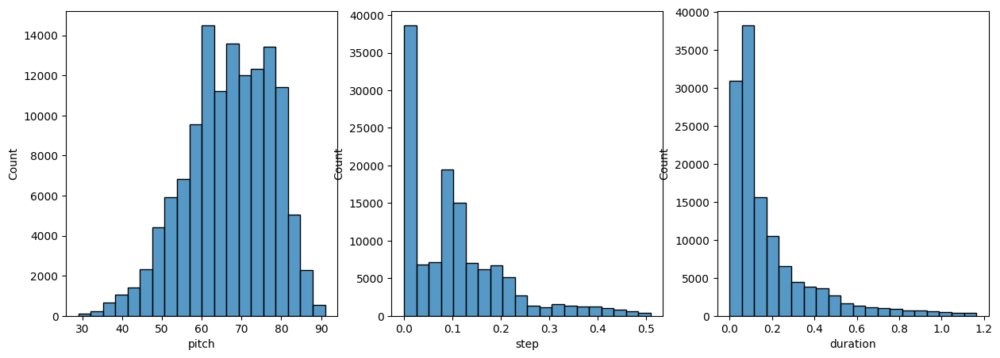

In [ ]:
plot_distributions(train_notes)

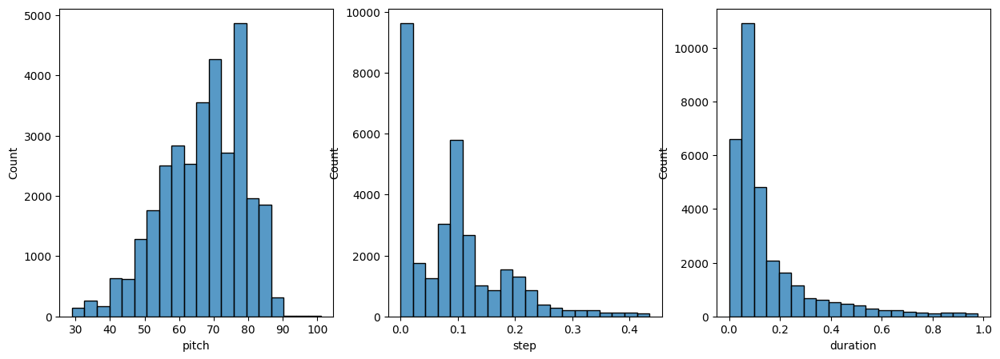

In [ ]:
plot_distributions(validation_notes)

Se observa que ambas distribuciones de entrenamiento y validación son similares. Para ``step`` se puede apreciar que el valor 0 o cercano a 0 es muy frecuente y esto se debe a polifonía de las piezas musicales. ``pitch`` parece tener una distribución que se asemeja a una normal, mientras  que ``duration`` se distribuye con asimetría a la derecha (notas en general no tan largas).

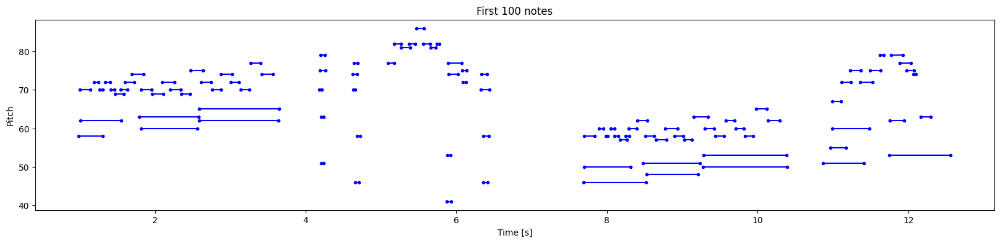

In [ ]:
plot_piano_roll(train_notes, count=100)

A partir de este plot se puede observar la interpretación de las primeras 100 notas musicales del dataset de entrenamiento. A continuación se puede reproducir para escuchar la composición de Mozart durante 30 segundos.

In [ ]:
example_file = 'example_mozart.midi'
example_pm = notes_to_midi(
    train_notes, out_file=example_file, instrument_name=instrument_name)

In [ ]:
display_audio(example_pm, seconds=30)

In [57]:
n_notes_train = len(train_notes)
print('Número de notas extraidas:', n_notes_train)

n_notes_validation = len(validation_notes)
print('Número de notas extraidas:', n_notes_validation)

Número de notas extraidas: 128920
Número de notas extraidas: 32251


#### Transformación a tf.data.datasets

Ahora, creamos un `tf.data.Dataset` a partir de estas notas extraidas. Se van a procesar las notas para adaptarlas al input de los modelos.



In [58]:
key_order = ['pitch', 'step', 'duration']

train = np.stack([train_notes[key] for key in key_order], axis=1)
print('Training dataset shape:', train.shape)

validation = np.stack([validation_notes[key] for key in key_order], axis=1)
print('Validation dataset shape:', validation.shape)

Training dataset shape: (128920, 3)
Validation dataset shape: (32251, 3)


In [59]:
notes_ds = tf.data.Dataset.from_tensor_slices(train)
print(notes_ds.element_spec)

notes_ds_validation = tf.data.Dataset.from_tensor_slices(validation)
print(notes_ds_validation.element_spec)

TensorSpec(shape=(3,), dtype=tf.float64, name=None)
TensorSpec(shape=(3,), dtype=tf.float64, name=None)


#### Tamaño de secuencia

Establecemos la longitud de la secuencia en 50 notas para para cada ejemplo y el tamaño del vocabulario (``vocab_size``) se establece en 128, representando todos los tonos compatibles con ``pretty_midi``. El tamaño de secuencia es un hiperparámetro que decidimos establecerlo en 50 arbitrariamente por simplicidad. No obstante, se podría probar a modificar dicho parámetro para ver como afecta a los modelos.

In [60]:
seq_length = 50

In [61]:
vocab_size = 128

seq_ds = create_sequences(notes_ds, seq_length, vocab_size, key_order)
print(seq_ds.element_spec)

seq_ds_validation = create_sequences(notes_ds_validation, seq_length, vocab_size, key_order)
print(seq_ds_validation.element_spec)

(TensorSpec(shape=(50, 3), dtype=tf.float64, name=None), {'pitch': TensorSpec(shape=(), dtype=tf.float64, name=None), 'step': TensorSpec(shape=(), dtype=tf.float64, name=None), 'duration': TensorSpec(shape=(), dtype=tf.float64, name=None)})
(TensorSpec(shape=(50, 3), dtype=tf.float64, name=None), {'pitch': TensorSpec(shape=(), dtype=tf.float64, name=None), 'step': TensorSpec(shape=(), dtype=tf.float64, name=None), 'duration': TensorSpec(shape=(), dtype=tf.float64, name=None)})


A continuación se agrupan los ejemplos en batches y se configura el conjunto de datos para obtener un mejor rendimiento.



In [62]:
batch_size = 1024
buffer_size_train = n_notes_train - seq_length  # the number of items in the dataset
buffer_size_validation = n_notes_validation - seq_length

train_ds = (seq_ds
            .shuffle(buffer_size_train)
            .batch(batch_size, drop_remainder=True)
            .cache()
            .prefetch(tf.data.experimental.AUTOTUNE))

validation_ds = (seq_ds_validation
            .batch(batch_size, drop_remainder=True)
            .cache()
            .prefetch(tf.data.experimental.AUTOTUNE))

In [63]:
print(train_ds.element_spec)
print(validation_ds.element_spec)

(TensorSpec(shape=(1024, 50, 3), dtype=tf.float64, name=None), {'pitch': TensorSpec(shape=(1024,), dtype=tf.float64, name=None), 'step': TensorSpec(shape=(1024,), dtype=tf.float64, name=None), 'duration': TensorSpec(shape=(1024,), dtype=tf.float64, name=None)})
(TensorSpec(shape=(1024, 50, 3), dtype=tf.float64, name=None), {'pitch': TensorSpec(shape=(1024,), dtype=tf.float64, name=None), 'step': TensorSpec(shape=(1024,), dtype=tf.float64, name=None), 'duration': TensorSpec(shape=(1024,), dtype=tf.float64, name=None)})


#### RNNs autorregresivas

El modelo tendrá tres salidas, una para cada variable de nota. Para ``step`` y ``duration``, se utiliza una función de pérdida personalizada basada en el error cuadrático medio que incentiva al modelo a generar valores no negativos ejerciendo presión positiva.

In [18]:
def mse_with_positive_pressure(y_true: tf.Tensor, y_pred: tf.Tensor):
  mse = (y_true - y_pred) ** 2
  positive_pressure = 10 * tf.maximum(-y_pred, 0.0) # Ejerce presión positiva
  return tf.reduce_mean(mse + positive_pressure)

##### LSTM sencilla

In [ ]:
input_shape = (seq_length, 3)
learning_rate = 0.0001

inputs = tf.keras.Input(input_shape)
x = tf.keras.layers.LSTM(128)(inputs)


outputs = {
  'pitch': tf.keras.layers.Dense(128, name='pitch')(x),
  'step': tf.keras.layers.Dense(1, name='step')(x),
  'duration': tf.keras.layers.Dense(1, name='duration')(x),
}

model_mozart1 = tf.keras.Model(inputs, outputs)

loss = {
      'pitch': tf.keras.losses.SparseCategoricalCrossentropy(
          from_logits=True),
       'step': mse_with_positive_pressure,
      'duration': mse_with_positive_pressure,
}

optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)

model_mozart1.compile(loss=loss, optimizer=optimizer)

model_mozart1.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 50, 3)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_1 (LSTM)       │ (None, 128)       │     67,584 │ input_layer_1[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ duration (Dense)    │ (None, 1)         │        129 │ lstm_1[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pitch (Dense)       │ (None, 128)       │     16,512 │ lstm_1[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ step (Dense)        │ (None, 1)         │        129 │ lstm_1[0][0]      │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 84,354 (329.51 KB)

 Trainable params: 84,354 (329.51 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
model_mozart1.evaluate(train_ds, return_dict=True)

125/125 ━━━━━━━━━━━━━━━━━━━━ 24s 10ms/step - duration_loss: 0.3387 - loss: 5.7751 - pitch_loss: 4.8453 - step_loss: 0.5699


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:151: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


{'duration_loss': 0.33907920122146606,
 'loss': 5.736043453216553,
 'pitch_loss': 4.807094573974609,
 'step_loss': 0.5688406229019165}

Se observa arriba que el loss del que parte pitch es mayor por eso le vamos a atribuir un peso de 0.05

In [ ]:
model_mozart1.compile(
    loss=loss,
    loss_weights={
        'pitch': 0.05,
        'step': 1.0,
        'duration':1.0,
    },
    optimizer=optimizer,
)

Definimos un EarlyStopping

In [ ]:
callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor='loss',
        patience=10,
        verbose=1,
        restore_best_weights=True),
]

Entrenamiento del modelo

In [ ]:
%%time
epochs = 250

history_mozart1 = model_mozart1.fit(
    train_ds,
    epochs=epochs,
    validation_data=validation_ds,
    callbacks=callbacks
)

Epoch 1/250
125/125 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - duration_loss: 0.1386 - loss: 0.4481 - pitch_loss: 4.8400 - step_loss: 0.0675 - val_duration_loss: 0.0892 - val_loss: 0.3498 - val_pitch_loss: 4.6197 - val_step_loss: 0.0295
Epoch 2/250
125/125 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - duration_loss: 0.0950 - loss: 0.3807 - pitch_loss: 4.7379 - step_loss: 0.0488 - val_duration_loss: 0.0864 - val_loss: 0.3417 - val_pitch_loss: 4.5182 - val_step_loss: 0.0295
Epoch 3/250
125/125 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - duration_loss: 0.0922 - loss: 0.3708 - pitch_loss: 4.5984 - step_loss: 0.0487 - val_duration_loss: 0.0820 - val_loss: 0.3103 - val_pitch_loss: 3.9719 - val_step_loss: 0.0297
Epoch 4/250
125/125 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - duration_loss: 0.0887 - loss: 0.3288 - pitch_loss: 3.8339 - step_loss: 0.0484 - val_duration_loss: 0.0757 - val_loss: 0.2878 - val_pitch_loss: 3.6627 - val_step_loss: 0.0291
Epoch 5/250
125/125 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - duration_loss: 0.0856 - 

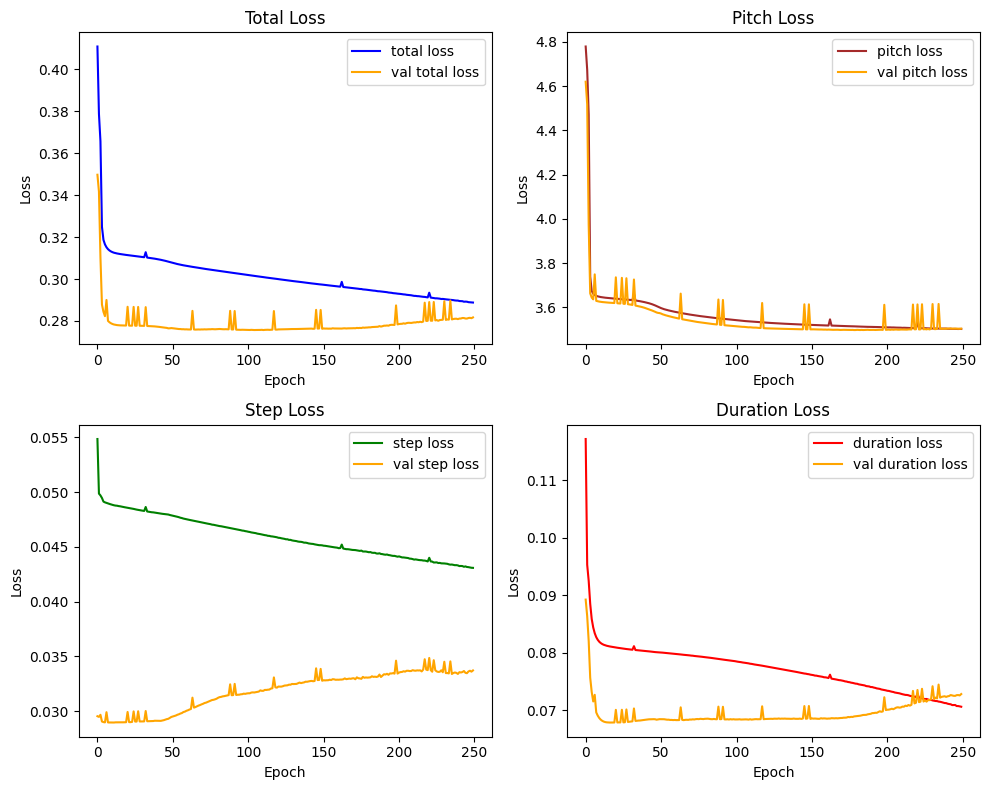

In [ ]:
plot_losses_rnn(history_mozart1)

En loss de train parace tener un comportamiento estable durante el entrenamiento.

Sin embargo, se puede apreciar que el loss de validación sufre fluctuaciones sugeriendo que el modelo aún puede no estar aprendiendo a generalizar correctamente. Para ``step`` y ``duration`` ocurre una cosa muy extraña, similar al comportamiento de una evolución con un modelo sobreregularizado. No hemos conseguido entender ni solucionar dicho comportamiento.

In [ ]:
# Crear un diccionario con el modelo y el historial
model_and_history = {
    'model': model_mozart1,
    'history': history_mozart1
}

# Guardar el diccionario en un archivo pickle
with open('/content/modelos/model_mozart1.pkl', 'wb') as f:
    pickle.dump(model_and_history, f)

##### Conv + 2 LSTM

In [ ]:
input_shape = (seq_length, 3)
learning_rate = 0.00005

inputs = tf.keras.Input(input_shape)

x = tf.keras.layers.Conv1D(64, 3, activation='relu')(inputs)
x = tf.keras.layers.LSTM(128, return_sequences=True)(x)
x = tf.keras.layers.LSTM(128)(x)

outputs = {
  'pitch': tf.keras.layers.Dense(128, name='pitch')(x),
  'step': tf.keras.layers.Dense(1, name='step')(x),
  'duration': tf.keras.layers.Dense(1, name='duration')(x),
}

model_mozart2 = tf.keras.Model(inputs, outputs)

loss = {
      'pitch': tf.keras.losses.SparseCategoricalCrossentropy(
          from_logits=True),
      'step': mse_with_positive_pressure,
      'duration': mse_with_positive_pressure,
}

optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)

model_mozart2.compile(loss=loss, optimizer=optimizer)

model_mozart2.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 50, 3)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d (Conv1D)     │ (None, 48, 64)    │        640 │ input_layer_1[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_1 (LSTM)       │ (None, 48, 128)   │     98,816 │ conv1d[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_2 (LSTM)       │ (None, 128)       │    131,584 │ lstm_1[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ duration (Dense)    │ (None, 1)         │        129 │ lstm_2[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pitch (Dense)       │ (None, 128)       │     16,512 │ lstm_2[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ step (Dense)        │ (None, 1)         │        129 │ lstm_2[0][0]      │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 247,810 (968.01 KB)

 Trainable params: 247,810 (968.01 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
model_mozart2.evaluate(train_ds, return_dict=True)

125/125 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - duration_loss: 0.1427 - loss: 5.2006 - pitch_loss: 4.8528 - step_loss: 0.2051


{'duration_loss': 0.14439962804317474,
 'loss': 5.164079666137695,
 'pitch_loss': 4.814498424530029,
 'step_loss': 0.20518217980861664}

In [ ]:
model_mozart2.compile(
    loss=loss,
    loss_weights={
        'pitch': 0.05,
        'step': 0.5,
        'duration':1.0,
    },
    optimizer=optimizer,
)

In [ ]:
callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor='loss',
        patience=10,
        verbose=1,
        restore_best_weights=True),
]

Entrenamiento del modelo

In [ ]:
%%time
epochs = 250

history_mozart2 = model_mozart2.fit(
    train_ds,
    epochs=epochs,
    validation_data=validation_ds,
    callbacks=callbacks
)

Epoch 1/250
125/125 ━━━━━━━━━━━━━━━━━━━━ 50s 45ms/step - duration_loss: 0.1183 - loss: 0.3940 - pitch_loss: 4.8463 - step_loss: 0.0668 - val_duration_loss: 0.0935 - val_loss: 0.3425 - val_pitch_loss: 4.6705 - val_step_loss: 0.0309
Epoch 2/250
125/125 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step - duration_loss: 0.0976 - loss: 0.3629 - pitch_loss: 4.8060 - step_loss: 0.0499 - val_duration_loss: 0.0923 - val_loss: 0.3388 - val_pitch_loss: 4.6240 - val_step_loss: 0.0306
Epoch 3/250
125/125 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - duration_loss: 0.0962 - loss: 0.3577 - pitch_loss: 4.7341 - step_loss: 0.0496 - val_duration_loss: 0.0901 - val_loss: 0.3209 - val_pitch_loss: 4.3068 - val_step_loss: 0.0310
Epoch 4/250
125/125 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - duration_loss: 0.0947 - loss: 0.3246 - pitch_loss: 4.1036 - step_loss: 0.0495 - val_duration_loss: 0.0860 - val_loss: 0.2866 - val_pitch_loss: 3.7126 - val_step_loss: 0.0299
Epoch 5/250
125/125 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - duration_loss: 0.0922

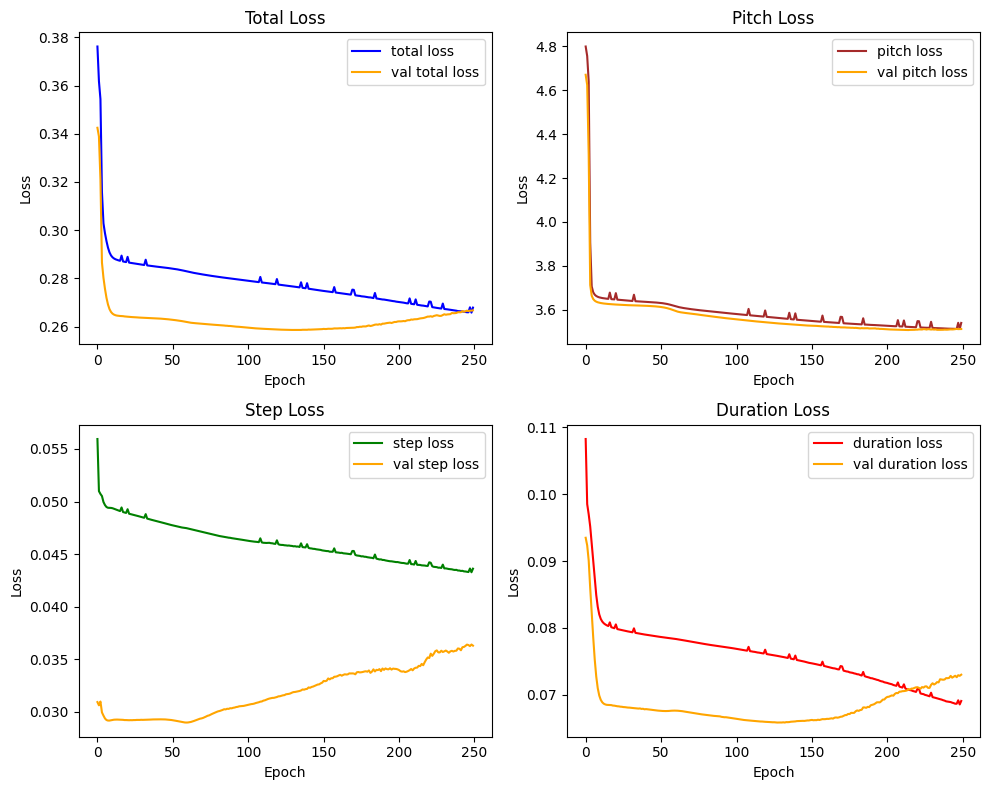

In [ ]:
plot_losses_rnn(history_mozart2)

Para este modelo ocurre lo mismo que con el modelo sencillo pero mejora un poco la estabilidad de la curva de validación.

In [ ]:
import pickle

# Crear un diccionario con el modelo y el historial
model_and_history = {
    'model': model_mozart2,
    'history': history_mozart2
}

# Guardar el diccionario en un archivo pickle
with open('/content/modelos/model_mozart2.pkl', 'wb') as f:
    pickle.dump(model_and_history, f)

##### Conv + LSTM + GRU

In [ ]:
input_shape = (seq_length, 3)
learning_rate = 0.00005

inputs = tf.keras.Input(input_shape)

x = tf.keras.layers.Conv1D(64, 3, activation='relu')(inputs)
x = tf.keras.layers.LSTM(128, return_sequences=True)(x)
x = tf.keras.layers.GRU(128)(x)

outputs = {
  'pitch': tf.keras.layers.Dense(128, name='pitch')(x),
  'step': tf.keras.layers.Dense(1, name='step')(x),
  'duration': tf.keras.layers.Dense(1, name='duration')(x),
}

model_mozart3 = tf.keras.Model(inputs, outputs)

loss = {
      'pitch': tf.keras.losses.SparseCategoricalCrossentropy(
          from_logits=True),
      'step': mse_with_positive_pressure,
      'duration': mse_with_positive_pressure,
}

optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)

model_mozart3.compile(loss=loss, optimizer=optimizer)

model_mozart3.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 50, 3)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1 (Conv1D)   │ (None, 48, 64)    │        640 │ input_layer_2[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_3 (LSTM)       │ (None, 48, 128)   │     98,816 │ conv1d_1[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru (GRU)           │ (None, 128)       │     99,072 │ lstm_3[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ duration (Dense)    │ (None, 1)         │        129 │ gru[0][0]         │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pitch (Dense)       │ (None, 128)       │     16,512 │ gru[0][0]         │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ step (Dense)        │ (None, 1)         │        129 │ gru[0][0]         │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 215,298 (841.01 KB)

 Trainable params: 215,298 (841.01 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
model_mozart3.evaluate(train_ds, return_dict=True)

125/125 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - duration_loss: 0.1559 - loss: 5.3752 - pitch_loss: 4.8478 - step_loss: 0.3715


{'duration_loss': 0.15756256878376007,
 'loss': 5.337233543395996,
 'pitch_loss': 4.80959939956665,
 'step_loss': 0.3700728416442871}

In [ ]:
model_mozart3.compile(
    loss=loss,
    loss_weights={
        'pitch': 0.05,
        'step': 0.5,
        'duration':1.0,
    },
    optimizer=optimizer,
)

In [ ]:
callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor='loss',
        patience=10,
        verbose=1,
        restore_best_weights=True),
]

Entrenamiento del modelo

In [ ]:
%%time
epochs = 250

history_mozart3 = model_mozart3.fit(
    train_ds,
    epochs=epochs,
    validation_data=validation_ds,
    callbacks=callbacks
)

Epoch 1/250
125/125 ━━━━━━━━━━━━━━━━━━━━ 8s 41ms/step - duration_loss: 0.1323 - loss: 0.4197 - pitch_loss: 4.8397 - step_loss: 0.0908 - val_duration_loss: 0.0923 - val_loss: 0.3404 - val_pitch_loss: 4.6625 - val_step_loss: 0.0300
Epoch 2/250
125/125 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - duration_loss: 0.0979 - loss: 0.3624 - pitch_loss: 4.7977 - step_loss: 0.0492 - val_duration_loss: 0.0898 - val_loss: 0.3359 - val_pitch_loss: 4.6205 - val_step_loss: 0.0301
Epoch 3/250
125/125 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - duration_loss: 0.0951 - loss: 0.3568 - pitch_loss: 4.7443 - step_loss: 0.0491 - val_duration_loss: 0.0875 - val_loss: 0.3297 - val_pitch_loss: 4.5426 - val_step_loss: 0.0301
Epoch 4/250
125/125 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - duration_loss: 0.0929 - loss: 0.3464 - pitch_loss: 4.5802 - step_loss: 0.0490 - val_duration_loss: 0.0819 - val_loss: 0.2848 - val_pitch_loss: 3.7571 - val_step_loss: 0.0301
Epoch 5/250
125/125 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - duration_loss: 0.0900 -

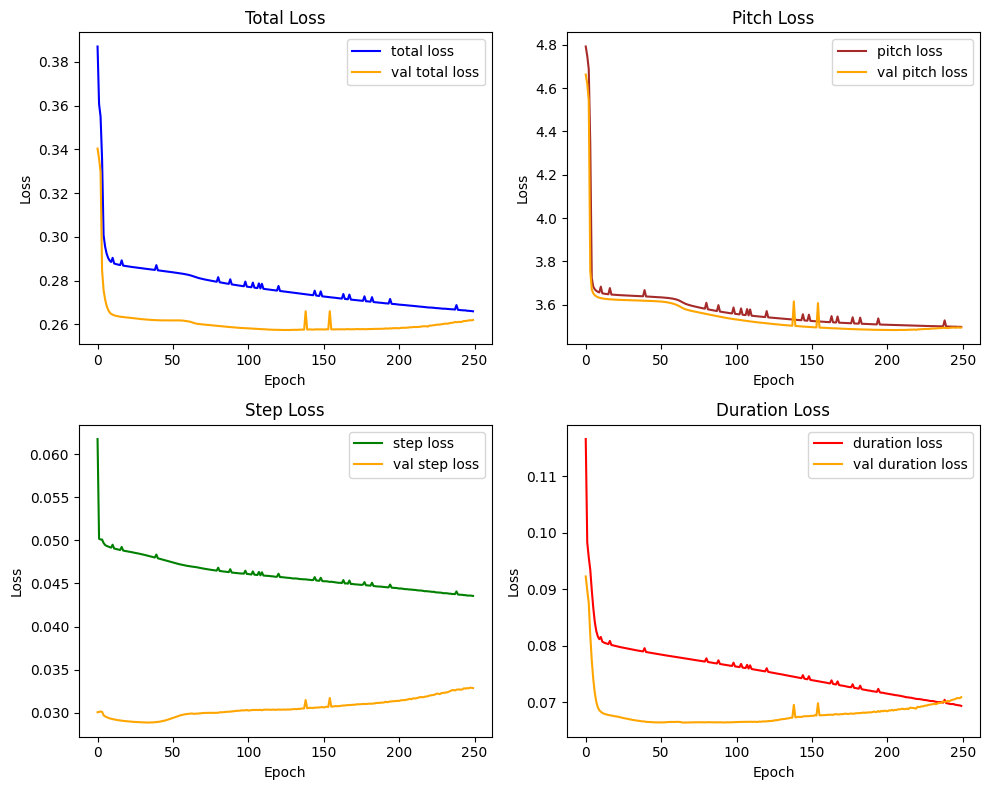

In [ ]:
plot_losses_rnn(history_mozart3)

Tiene un comportamiento muy similar al convolucional con dos LSTMs

In [ ]:
import pickle

# Crear un diccionario con el modelo y el historial
model_and_history = {
    'model': model_mozart3,
    'history': history_mozart3
}

# Guardar el diccionario en un archivo pickle
with open('/content/modelos/model_mozart3.pkl', 'wb') as f:
    pickle.dump(model_and_history, f)

##### Generación de notas

Para utilizar el modelo para generar notas, primero se debe proporcionar una secuencia inicial de notas. La función a continuación genera una nota a partir de una secuencia de notas.

Para el ``pitch``, se extrae una muestra de la distribución de notas producidas por el modelo, y no simplemente se elige la nota con la "probabilidad" más alta. Elegir siempre la nota con la "probabilidad" más alta conduciría a secuencias repetitivas de notas generadas.

El parámetro `temperature` se puede usar para controlar la aleatoriedad de las notas generadas.

En el caso de Mozart la sequencia de notas a partir de la cual genera notas es la siguiente:

None


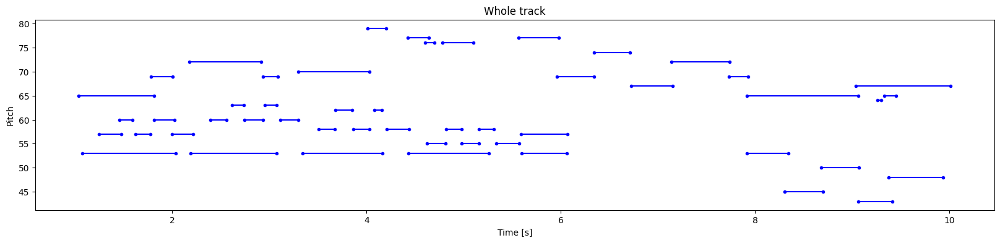

In [ ]:
out_file_mozart1 = 'sequence_mozart1.mid'
out_pm_mozart1 = notes_to_midi(
    train_notes[:50], out_file=out_file_mozart1, instrument_name=instrument_name)


print(plot_piano_roll(train_notes[:50]))

display_audio(out_pm_mozart1, seconds=60)

LSTM sencilla

None


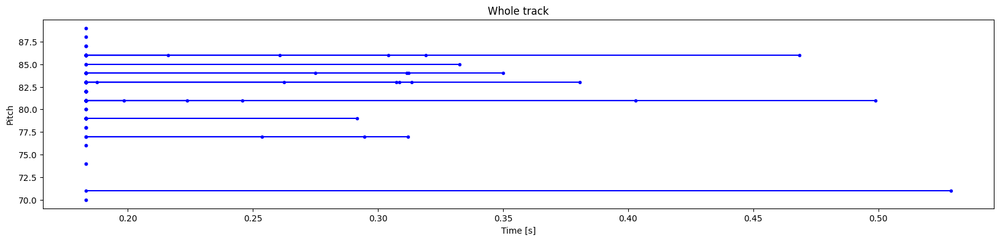

In [ ]:
temperature = 2
num_predictions = 120

mozart1_df = generate_notes(
    model=model_mozart1,
    first_seq=train_notes,
    key_order=key_order,
    vocab_size=vocab_size,
    seq_length=seq_length,
    temperature=temperature,
    num_predictions=num_predictions
)

out_file_mozart1 = 'mozart1.mid'
out_pm_mozart1 = notes_to_midi(
    mozart1_df, out_file=out_file_mozart1, instrument_name=instrument_name)


print(plot_piano_roll(mozart1_df))

display_audio(out_pm_mozart1, seconds=60)

El modelo sencillo simplemente toca todas las notas con un valor asociado de 0 a la variable ``step``, por tanto se tocan todas a la vez. Para el caso de las otras dos variables si parece haber mas diversidad de valores.

Conv + 2 LSTM

None


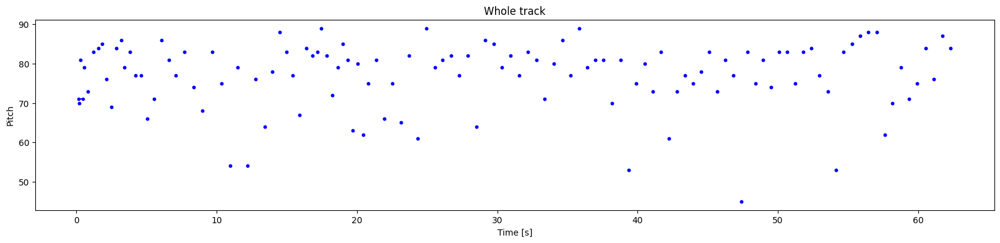

In [ ]:
temperature = 2
num_predictions = 120

mozart2_df = generate_notes(
    model=model_mozart2,
    first_seq=train_notes,
    key_order=key_order,
    vocab_size=vocab_size,
    seq_length=seq_length,
    temperature=temperature,
    num_predictions=num_predictions
)

out_file_mozart2 = 'mozart2.mid'
out_pm_mozart2 = notes_to_midi(
    mozart2_df, out_file=out_file_mozart2, instrument_name=instrument_name)

print(plot_piano_roll(mozart2_df))

display_audio(out_pm_mozart2, seconds=60)

Para este modelo obtenemos mejores resultados con mas variedad de valores en las tres características.

Conv + LSTM + GRU

None


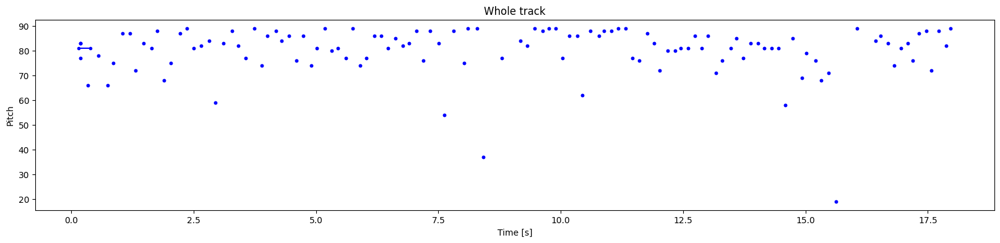

In [ ]:
temperature = 2
num_predictions = 120

mozart3_df = generate_notes(
    model=model_mozart3,
    first_seq=train_notes,
    key_order=key_order,
    vocab_size=vocab_size,
    seq_length=seq_length,
    temperature=temperature,
    num_predictions=num_predictions
)

out_file_mozart3 = 'mozart3.mid'
out_pm_mozart3 = notes_to_midi(
    mozart3_df, out_file=out_file_mozart3, instrument_name=instrument_name)

print(plot_piano_roll(mozart3_df))

display_audio(out_pm_mozart3, seconds=60)

El modelo con la capa GRU parece haber generado notas con una duración mas corta y con mas variedad al igual que el modelo anterior.

A nuestro parecer, el úlitmo modelo con la capa GRU es nuestro ganador a la hora de intentar imitar a la música de Mozart. Aun así, pensamos que un niño de dos años podría competir en la misma liga.

#### GAN

##### Entrenamiento

In [ ]:
# ---------------------------
# Compile MuseGAN
# ---------------------------
latent_dim = 1000
seq_length = 32
num_tracks = 2

generator = build_generator()
discriminator = build_discriminator()
discriminator.compile(loss='binary_crossentropy', optimizer=Adam(0.0005, 0.5), metrics=['accuracy'])

gan_input = Input(shape=(latent_dim,))
generated_music = generator(gan_input)

# Congelamos el discriminador para entrenar solo el generador
discriminator.trainable = False
gan_output = discriminator(generated_music)
gan = Model(gan_input, gan_output)
gan.compile(loss='binary_crossentropy', optimizer=Adam(0.0001, 0.5))

reference_midi = os.path.join(os.getcwd(), 'pieces','mozart_midis', 'MIDI-Unprocessed_02_R1_2011_MID--AUDIO_R1-D1_09_Track09_wav.midi')


# Entrenamos el modelo
epochs = 1000  # O el número que consideres
batch_size = 32  # O el tamaño de batch que estés usando

if not os.path.exists(reference_midi):
    print(f"Error: The file {reference_midi} does not exist.")
else:
    real_music = midi_to_piano_roll(reference_midi)
    real_music = np.expand_dims(real_music, axis=-1)
    real_music = np.repeat(real_music, num_tracks, axis=-1)
    real_music = np.expand_dims(real_music, axis=0)
    real_music = np.repeat(real_music, batch_size, axis=0)


# Inicializamos listas para almacenar las pérdidas
d_losses = []  # Lista para almacenar la pérdida del discriminador
g_losses = []  # Lista para almacenar la pérdida del generador

for epoch in range(epochs):
    # Entrenamos el discriminador
    noise = np.random.normal(0, 1, (batch_size, latent_dim))
    generated_music = generator.predict(noise)


    # Concatenamos las entradas reales y generadas
    X = np.concatenate([real_music, generated_music])
    y = np.concatenate([np.ones(batch_size), np.zeros(batch_size)])  # 1 para real, 0 para falso

    # Entrenamos el discriminador con los datos concatenados
    d_loss = discriminator.train_on_batch(X, y)

    # Ahora entrenamos el generador
    # Volvemos a permitir el entrenamiento del discriminador en la GAN
    discriminator.trainable = False  # Aseguramos que el discriminador no se entrene aquí

    # Entrenamos la GAN (solo el generador)
    noise = np.random.normal(0, 1, (batch_size, latent_dim))  # Generamos ruido aleatorio
    y_gan = np.ones(batch_size)  # La salida deseada para el generador es que pase como real

    g_loss = gan.train_on_batch(noise, y_gan)

    # Restauramos el entrenamiento del discriminador después de cada iteración de la GAN
    discriminator.trainable = True

    # Almacenamos los valores de las pérdidas
    d_losses.append(d_loss[0])  # Pérdida del discriminador
    g_losses.append(g_loss)  # Pérdida del generador

    # Imprimimos el progreso
    if epoch % 10 == 0:
        print(f"Epoch {epoch} | D Loss: {d_loss[0]} | G Loss: {g_loss}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py:82: UserWarning: The model does not have any trainable weights.
  warnings.warn("The model does not have any trainable weights.")


Epoch 0 | D Loss: 1.0372929573059082 | G Loss: 0.6571089625358582
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
Epoch 10 | D Loss: 1.1932940483093262 | G Loss: 0.6335822939872742
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
Epoch 20 | D Loss: 1.1608270406723022 | G Loss: 0.6012214422225952
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/

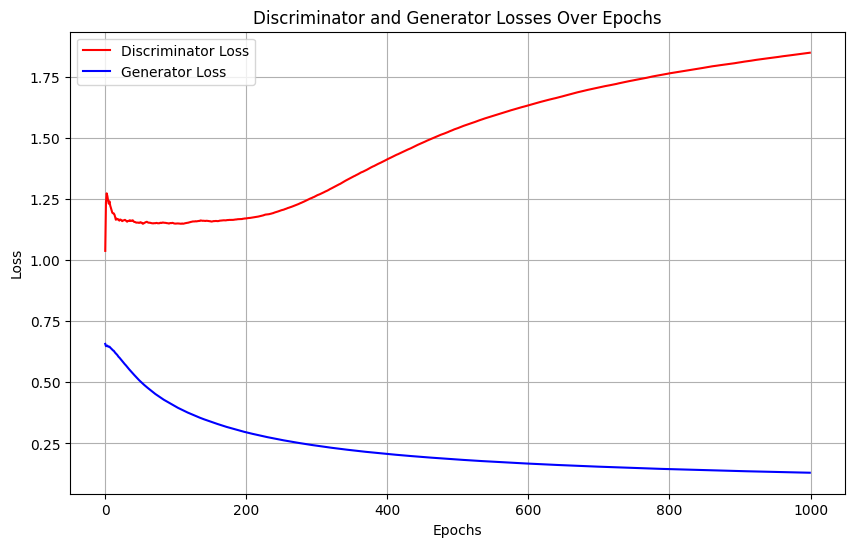

In [22]:
plot_losses_gan(d_losses, g_losses, epochs)

La evolución de las pérdidas del discriminadoy y generador parecen evolucionar correctamente. No obstante, decidimos no definir un número mayor de épocas ya que el navegador crasheaba a partir de la época 3000. Aun así, el resultado que obtuvimos aumentando las épocas no difería del obtenido con 1000 épocas.

##### Generación de notas

In [ ]:
midi_file = generate_midi_from_reference(generator, reference_midi)
display_audio(midi_file, seconds=180)  # Display the audio in the notebook

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


La secuencia generada por la GAN parece tener mas riqueza armónica, generando una banda sonora merecedora de una película de terror de bajo presupuesto.

## Piezas con ritmo más "uniforme" (lentas)

In [19]:
piezas = ['MIDI-Unprocessed_074_PIANO074_MID--AUDIO-split_07-08-17_Piano-e_2-04_wav--2.midi',
          'MIDI-Unprocessed_06_R1_2011_MID--AUDIO_R1-D2_14_Track14_wav.midi',
          'MIDI-Unprocessed_09_R3_2008_01-07_ORIG_MID--AUDIO_09_R3_2008_wav--1.midi',
          'MIDI-Unprocessed_Recital4_MID--AUDIO_04_R1_2018_wav--1.midi',
          'MIDI-Unprocessed_Recital5-7_MID--AUDIO_07_R1_2018_wav--3.midi',
          'MIDI-Unprocessed_Schubert7-9_MID--AUDIO_15_R2_2018_wav.midi',
          'MIDI-Unprocessed_Schubert4-6_MID--AUDIO_10_R2_2018_wav.midi',
          'MIDI-Unprocessed_072_PIANO072_MID--AUDIO-split_07-08-17_Piano-e_1-06_wav--3.midi',
          'ORIG-MIDI_02_7_7_13_Group__MID--AUDIO_18_R1_2013_wav--4.midi',
          'MIDI-Unprocessed_SMF_17_R1_2004_01-02_ORIG_MID--AUDIO_20_R2_2004_04_Track04_wav.midi']

#### Conjunto de entrenamiento

In [20]:
midis_dir = os.path.join(os.getcwd(), 'pieces', 'MIDIS')
# Listas para almacenar las notas de entrenamiento y validación
train_notes = []
validation_notes = []

# Iterar sobre los archivos MIDI encontrados
for f in piezas:
    full_file_path = os.path.join(midis_dir, f)

    # Extraer las notas del archivo MIDI (suponiendo que midi_to_notes(f) hace esto)
    notes = midi_to_notes(full_file_path)

    # Verificar que las notas sean válidas
    if notes is not None and not notes.empty:
        # Dividir las notas en 80% entrenamiento y 20% validación
        train_size = int(0.8 * len(notes))  # Primer 80% para entrenamiento
        validation_size = len(notes) - train_size  # El resto es para validación

        # Almacenar en las listas correspondientes
        train_notes.append(notes.iloc[:train_size])  # Primer 80% de las notas
        validation_notes.append(notes.iloc[train_size:])  # Último 20% de las notas

# Verificar si hay objetos en train_notes y validation_notes antes de concatenar
if train_notes:
    train_notes = pd.concat(train_notes, ignore_index=True)

if validation_notes:
    validation_notes = pd.concat(validation_notes, ignore_index=True)

Gráficamos las distribuciones de las características de las notas para asegurarnos de que la separación entre entrenamiento y validación sea lo mas correcta posible

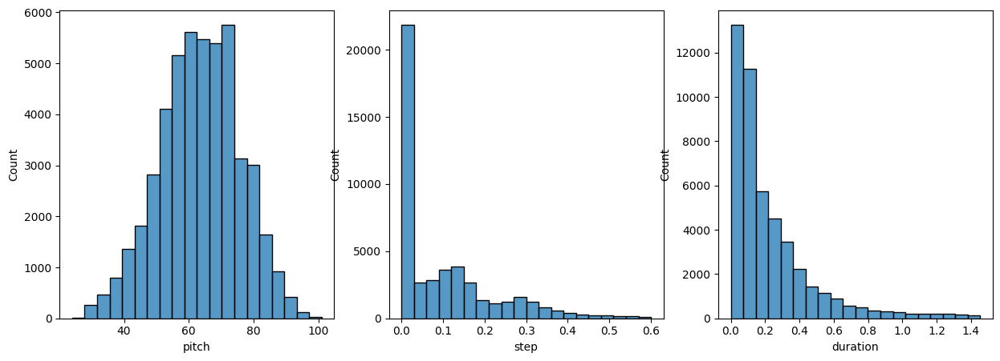

In [ ]:
plot_distributions(train_notes)

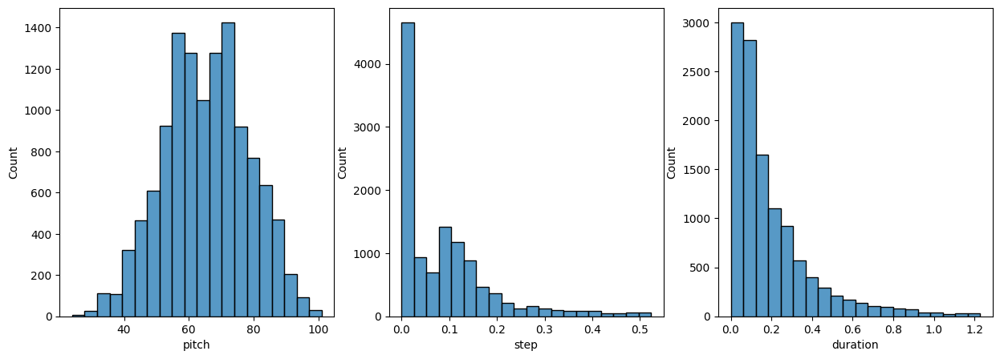

In [ ]:
plot_distributions(validation_notes)

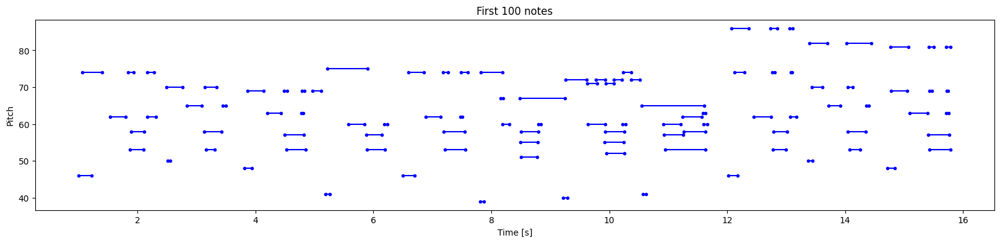

In [ ]:
plot_piano_roll(train_notes, count=100)

In [21]:
n_notes_train = len(train_notes)
print('Número de notas extraidas:', n_notes_train)

n_notes_validation = len(validation_notes)
print('Número de notas extraidas:', n_notes_validation)

Número de notas extraidas: 48362
Número de notas extraidas: 12095


#### Transformación a tf.data.datasets

In [22]:
key_order = ['pitch', 'step', 'duration']

train = np.stack([train_notes[key] for key in key_order], axis=1)
print('Training dataset shape:', train.shape)

validation = np.stack([validation_notes[key] for key in key_order], axis=1)
print('Validation dataset shape:', validation.shape)

Training dataset shape: (48362, 3)
Validation dataset shape: (12095, 3)


In [23]:
notes_ds = tf.data.Dataset.from_tensor_slices(train)
print(notes_ds.element_spec)

notes_ds_validation = tf.data.Dataset.from_tensor_slices(validation)
print(notes_ds_validation.element_spec)

TensorSpec(shape=(3,), dtype=tf.float64, name=None)
TensorSpec(shape=(3,), dtype=tf.float64, name=None)


#### Tamaño de secuencia

In [24]:
seq_length = 50

In [25]:
vocab_size = 128
seq_ds = create_sequences(notes_ds, seq_length, vocab_size, key_order)
seq_ds_validation = create_sequences(notes_ds_validation, seq_length, vocab_size, key_order)

print(seq_ds.element_spec)
print(seq_ds_validation.element_spec)

(TensorSpec(shape=(50, 3), dtype=tf.float64, name=None), {'pitch': TensorSpec(shape=(), dtype=tf.float64, name=None), 'step': TensorSpec(shape=(), dtype=tf.float64, name=None), 'duration': TensorSpec(shape=(), dtype=tf.float64, name=None)})
(TensorSpec(shape=(50, 3), dtype=tf.float64, name=None), {'pitch': TensorSpec(shape=(), dtype=tf.float64, name=None), 'step': TensorSpec(shape=(), dtype=tf.float64, name=None), 'duration': TensorSpec(shape=(), dtype=tf.float64, name=None)})


A continuación se agrupan los ejemplos en batches y se configura el conjunto de datos para obtener un mejor rendimiento.



In [26]:
batch_size = 512
buffer_size = n_notes_train - seq_length  # the number of items in the dataset
train_ds = (seq_ds
            .shuffle(buffer_size)
            .batch(batch_size, drop_remainder=True)
            .cache()
            .prefetch(tf.data.experimental.AUTOTUNE))

validation_ds = (seq_ds_validation
                 .batch(batch_size, drop_remainder=True)
                 .cache()
                 .prefetch(tf.data.experimental.AUTOTUNE))

In [27]:
print(train_ds.element_spec)
print(validation_ds.element_spec)

(TensorSpec(shape=(512, 50, 3), dtype=tf.float64, name=None), {'pitch': TensorSpec(shape=(512,), dtype=tf.float64, name=None), 'step': TensorSpec(shape=(512,), dtype=tf.float64, name=None), 'duration': TensorSpec(shape=(512,), dtype=tf.float64, name=None)})
(TensorSpec(shape=(512, 50, 3), dtype=tf.float64, name=None), {'pitch': TensorSpec(shape=(512,), dtype=tf.float64, name=None), 'step': TensorSpec(shape=(512,), dtype=tf.float64, name=None), 'duration': TensorSpec(shape=(512,), dtype=tf.float64, name=None)})


#### RNNs autorregresivas

El modelo tendrá tres salidas, una para cada variable de nota. Para step y duration, se utiliza una función de pérdida personalizada basada en el error cuadrático medio que incentiva al modelo a generar valores no negativos.

In [ ]:
def mse_with_positive_pressure(y_true: tf.Tensor, y_pred: tf.Tensor):
  mse = (y_true - y_pred) ** 2
  positive_pressure = 10 * tf.maximum(-y_pred, 0.0) # Ejerce presión positiva
  return tf.reduce_mean(mse + positive_pressure)

##### LSTM sencilla

In [ ]:
input_shape = (seq_length, 3)
learning_rate = 0.0001

inputs = tf.keras.Input(input_shape)
x = tf.keras.layers.LSTM(128)(inputs)


outputs = {
  'pitch': tf.keras.layers.Dense(128, name='pitch')(x),
  'step': tf.keras.layers.Dense(1, name='step')(x),
  'duration': tf.keras.layers.Dense(1, name='duration')(x),
}

model_uniforme1 = tf.keras.Model(inputs, outputs)

loss = {
      'pitch': tf.keras.losses.SparseCategoricalCrossentropy(
          from_logits=True),
       'step': mse_with_positive_pressure,
      'duration': mse_with_positive_pressure,
}

optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)

model_uniforme1.compile(loss=loss, optimizer=optimizer)

model_uniforme1.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 50, 3)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_1 (LSTM)       │ (None, 128)       │     67,584 │ input_layer_1[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ duration (Dense)    │ (None, 1)         │        129 │ lstm_1[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pitch (Dense)       │ (None, 128)       │     16,512 │ lstm_1[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ step (Dense)        │ (None, 1)         │        129 │ lstm_1[0][0]      │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 84,354 (329.51 KB)

 Trainable params: 84,354 (329.51 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
model_uniforme1.evaluate(train_ds, return_dict=True)

94/94 ━━━━━━━━━━━━━━━━━━━━ 11s 12ms/step - duration_loss: 0.4182 - loss: 5.4125 - pitch_loss: 4.8428 - step_loss: 0.1515


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:151: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


{'duration_loss': 0.42504435777664185,
 'loss': 5.409666061401367,
 'pitch_loss': 4.8427019119262695,
 'step_loss': 0.14192113280296326}

In [ ]:
model_uniforme1.compile(
    loss=loss,
    loss_weights={
        'pitch': 0.05,
        'step': 1,
        'duration':1,
    },
    optimizer=optimizer,
)

In [ ]:
callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor='loss',
        patience=10,
        verbose=1,
        restore_best_weights=True),
]

Entrenamiento del modelo

In [ ]:
%%time
epochs = 250

history_uniforme1 = model_uniforme1.fit(
    train_ds,
    epochs=epochs,
    validation_data=validation_ds,
    callbacks=callbacks
)

Epoch 1/250
94/94 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - duration_loss: 0.2458 - loss: 0.6338 - pitch_loss: 4.8287 - step_loss: 0.1466 - val_duration_loss: 0.1713 - val_loss: 0.4315 - val_pitch_loss: 4.5779 - val_step_loss: 0.0313
Epoch 2/250
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - duration_loss: 0.1723 - loss: 0.5483 - pitch_loss: 4.7551 - step_loss: 0.1383 - val_duration_loss: 0.1645 - val_loss: 0.4215 - val_pitch_loss: 4.5120 - val_step_loss: 0.0314
Epoch 3/250
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - duration_loss: 0.1687 - loss: 0.5392 - pitch_loss: 4.6767 - step_loss: 0.1367 - val_duration_loss: 0.1612 - val_loss: 0.4136 - val_pitch_loss: 4.4213 - val_step_loss: 0.0314
Epoch 4/250
94/94 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - duration_loss: 0.1655 - loss: 0.5282 - pitch_loss: 4.5485 - step_loss: 0.1353 - val_duration_loss: 0.1573 - val_loss: 0.3942 - val_pitch_loss: 4.1188 - val_step_loss: 0.0310
Epoch 5/250
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - duration_loss: 0.1607 - loss: 0.50

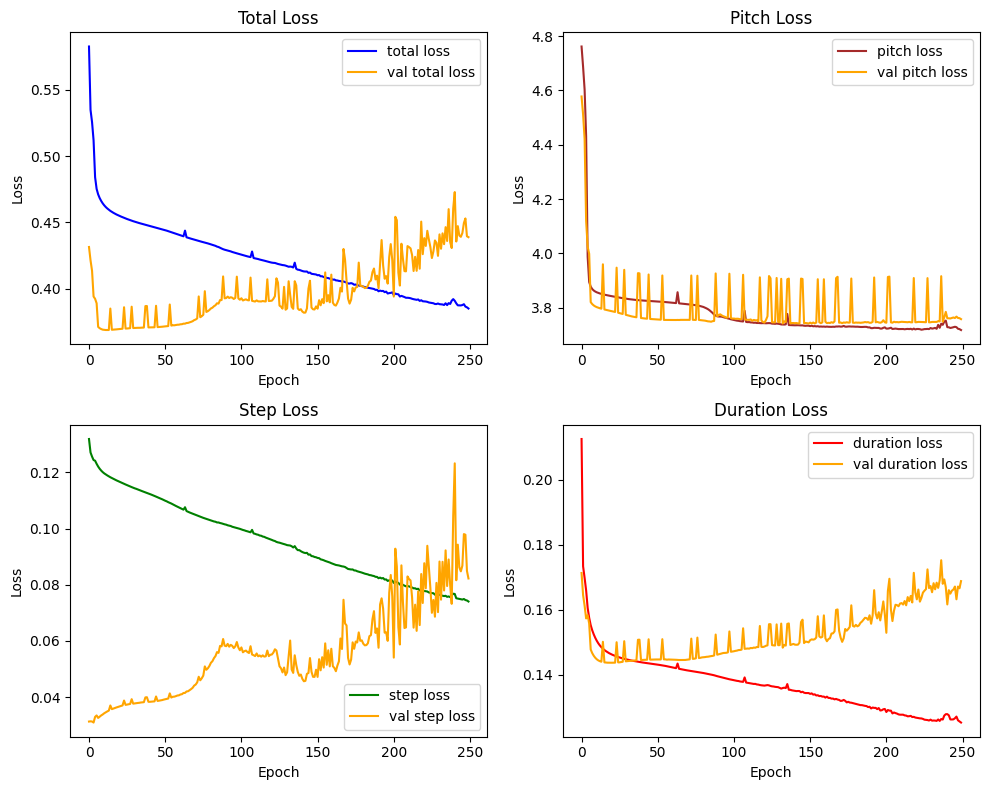

In [ ]:
plot_losses_rnn(history_uniforme1)

Se obtienen resultados similares que con el dataset de Mozart

In [ ]:
model_and_history = {
    'model': model_uniforme1,
    'history': history_uniforme1
}

with open('/content/modelos/model_uniforme1.pkl', 'wb') as f:
    pickle.dump(model_and_history, f)

##### Conv + 2 LSTM

In [ ]:
input_shape = (seq_length, 3)
learning_rate = 0.00005

inputs = tf.keras.Input(input_shape)

x = tf.keras.layers.Conv1D(64, 3, activation='relu')(inputs)
x = tf.keras.layers.LSTM(128, return_sequences=True)(x)
x = tf.keras.layers.LSTM(128)(x)

outputs = {
  'pitch': tf.keras.layers.Dense(128, name='pitch')(x),
  'step': tf.keras.layers.Dense(1, name='step')(x),
  'duration': tf.keras.layers.Dense(1, name='duration')(x),
}

model_uniforme2 = tf.keras.Model(inputs, outputs)

loss = {
      'pitch': tf.keras.losses.SparseCategoricalCrossentropy(
          from_logits=True),
      'step': mse_with_positive_pressure,
      'duration': mse_with_positive_pressure,
}

optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)

model_uniforme2.compile(loss=loss, optimizer=optimizer)

model_uniforme2.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 50, 3)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d (Conv1D)     │ (None, 48, 64)    │        640 │ input_layer_2[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_2 (LSTM)       │ (None, 48, 128)   │     98,816 │ conv1d[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_3 (LSTM)       │ (None, 128)       │    131,584 │ lstm_2[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ duration (Dense)    │ (None, 1)         │        129 │ lstm_3[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pitch (Dense)       │ (None, 128)       │     16,512 │ lstm_3[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ step (Dense)        │ (None, 1)         │        129 │ lstm_3[0][0]      │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 247,810 (968.01 KB)

 Trainable params: 247,810 (968.01 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
model_uniforme2.evaluate(train_ds, return_dict=True)

94/94 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - duration_loss: 0.2734 - loss: 5.2773 - pitch_loss: 4.8542 - step_loss: 0.1497


{'duration_loss': 0.2775824964046478,
 'loss': 5.219747543334961,
 'pitch_loss': 4.803649425506592,
 'step_loss': 0.13851679861545563}

In [ ]:
model_uniforme2.compile(
    loss=loss,
    loss_weights={
        'pitch': 0.05,
        'step': 0.5,
        'duration':1.0,
    },
    optimizer=optimizer,
)

In [ ]:
callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor='loss',
        patience=10,
        verbose=1,
        restore_best_weights=True),
]

Entrenamiento del modelo

In [ ]:
%%time
epochs = 250

history_uniforme2 = model_uniforme2.fit(
    train_ds,
    epochs=epochs,
    validation_data=validation_ds,
    callbacks=callbacks
)

Epoch 1/250
94/94 ━━━━━━━━━━━━━━━━━━━━ 58s 583ms/step - duration_loss: 0.2150 - loss: 0.5294 - pitch_loss: 4.8487 - step_loss: 0.1438 - val_duration_loss: 0.1725 - val_loss: 0.4195 - val_pitch_loss: 4.6229 - val_step_loss: 0.0317
Epoch 2/250
94/94 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - duration_loss: 0.1752 - loss: 0.4846 - pitch_loss: 4.8142 - step_loss: 0.1374 - val_duration_loss: 0.1690 - val_loss: 0.4139 - val_pitch_loss: 4.5809 - val_step_loss: 0.0316
Epoch 3/250
94/94 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - duration_loss: 0.1720 - loss: 0.4780 - pitch_loss: 4.7556 - step_loss: 0.1364 - val_duration_loss: 0.1669 - val_loss: 0.4058 - val_pitch_loss: 4.4651 - val_step_loss: 0.0312
Epoch 4/250
94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - duration_loss: 0.1700 - loss: 0.4647 - pitch_loss: 4.5389 - step_loss: 0.1355 - val_duration_loss: 0.1649 - val_loss: 0.3820 - val_pitch_loss: 4.0250 - val_step_loss: 0.0317
Epoch 5/250
94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - duration_loss: 0.1693 - loss: 0.

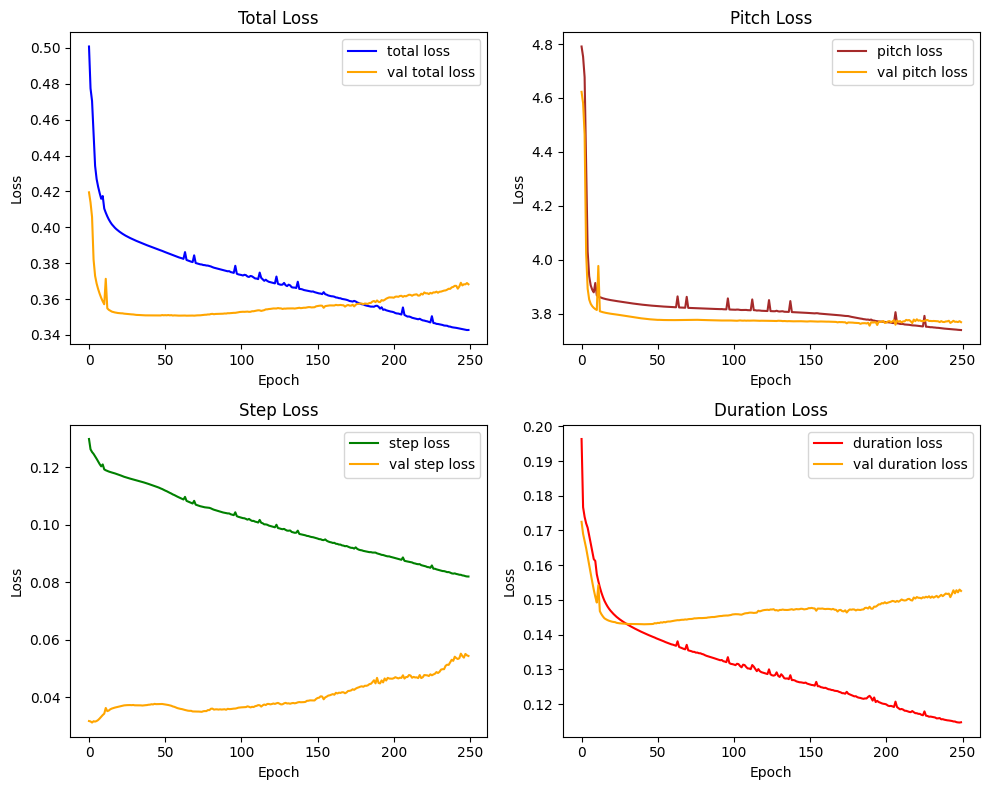

In [ ]:
plot_losses_rnn(history_uniforme2)

Con este dataset, en la variable ``duration`` parece haber un sobreajuste al contrario que la sobreregularización con el otro dataset. Las otras variables tienen el mismo comportamiento.

In [ ]:
model_and_history = {
    'model': model_uniforme2,
    'history': history_uniforme2
}

with open('/content/modelos/model_uniforme2.pkl', 'wb') as f:
    pickle.dump(model_and_history, f)

##### Conv + LSTM + GRU

In [45]:
input_shape = (seq_length, 3)
learning_rate = 0.00005

inputs = tf.keras.Input(input_shape)

x = tf.keras.layers.Conv1D(64, 3, activation='relu')(inputs)
x = tf.keras.layers.LSTM(128, return_sequences=True)(x)
x = tf.keras.layers.GRU(128)(x)

outputs = {
  'pitch': tf.keras.layers.Dense(128, name='pitch')(x),
  'step': tf.keras.layers.Dense(1, name='step')(x),
  'duration': tf.keras.layers.Dense(1, name='duration')(x),
}

model_uniforme3 = tf.keras.Model(inputs, outputs)

loss = {
      'pitch': tf.keras.losses.SparseCategoricalCrossentropy(
          from_logits=True),
      'step': mse_with_positive_pressure,
      'duration': mse_with_positive_pressure,
}

optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)

model_uniforme3.compile(loss=loss, optimizer=optimizer)

model_uniforme3.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 50, 3)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1 (Conv1D)   │ (None, 48, 64)    │        640 │ input_layer_1[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_1 (LSTM)       │ (None, 48, 128)   │     98,816 │ conv1d_1[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_1 (GRU)         │ (None, 128)       │     99,072 │ lstm_1[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ duration (Dense)    │ (None, 1)         │        129 │ gru_1[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pitch (Dense)       │ (None, 128)       │     16,512 │ gru_1[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ step (Dense)        │ (None, 1)         │        129 │ gru_1[0][0]       │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 215,298 (841.01 KB)

 Trainable params: 215,298 (841.01 KB)

 Non-trainable params: 0 (0.00 B)

In [46]:
model_uniforme3.evaluate(train_ds, return_dict=True)

94/94 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - duration_loss: 0.9130 - loss: 5.9273 - pitch_loss: 4.8535 - step_loss: 0.1607


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:151: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


{'duration_loss': 0.9199767708778381,
 'loss': 5.924843788146973,
 'pitch_loss': 4.8536295890808105,
 'step_loss': 0.15123803913593292}

In [47]:
model_uniforme3.compile(
    loss=loss,
    loss_weights={
        'pitch': 0.05,
        'step': 0.8,
        'duration':1.0,
    },
    optimizer=optimizer,
)

In [48]:
callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor='loss',
        patience=10,
        verbose=1,
        restore_best_weights=True),
]

Entrenamiento del modelo

In [49]:
%%time
epochs = 250

history_uniforme3 = model_uniforme3.fit(
    train_ds,
    epochs=epochs,
    validation_data=validation_ds,
    callbacks=callbacks
)

Epoch 1/250
94/94 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - duration_loss: 0.3528 - loss: 0.7185 - pitch_loss: 4.8487 - step_loss: 0.1542 - val_duration_loss: 0.1921 - val_loss: 0.4497 - val_pitch_loss: 4.6340 - val_step_loss: 0.0324
Epoch 2/250
94/94 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - duration_loss: 0.1895 - loss: 0.5429 - pitch_loss: 4.8214 - step_loss: 0.1404 - val_duration_loss: 0.1769 - val_loss: 0.4324 - val_pitch_loss: 4.5995 - val_step_loss: 0.0318
Epoch 3/250
94/94 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - duration_loss: 0.1789 - loss: 0.5285 - pitch_loss: 4.7839 - step_loss: 0.1379 - val_duration_loss: 0.1700 - val_loss: 0.4241 - val_pitch_loss: 4.5682 - val_step_loss: 0.0321
Epoch 4/250
94/94 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - duration_loss: 0.1740 - loss: 0.5208 - pitch_loss: 4.7477 - step_loss: 0.1368 - val_duration_loss: 0.1671 - val_loss: 0.4194 - val_pitch_loss: 4.5314 - val_step_loss: 0.0321
Epoch 5/250
94/94 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - duration_loss: 0.1711 - loss: 0.51

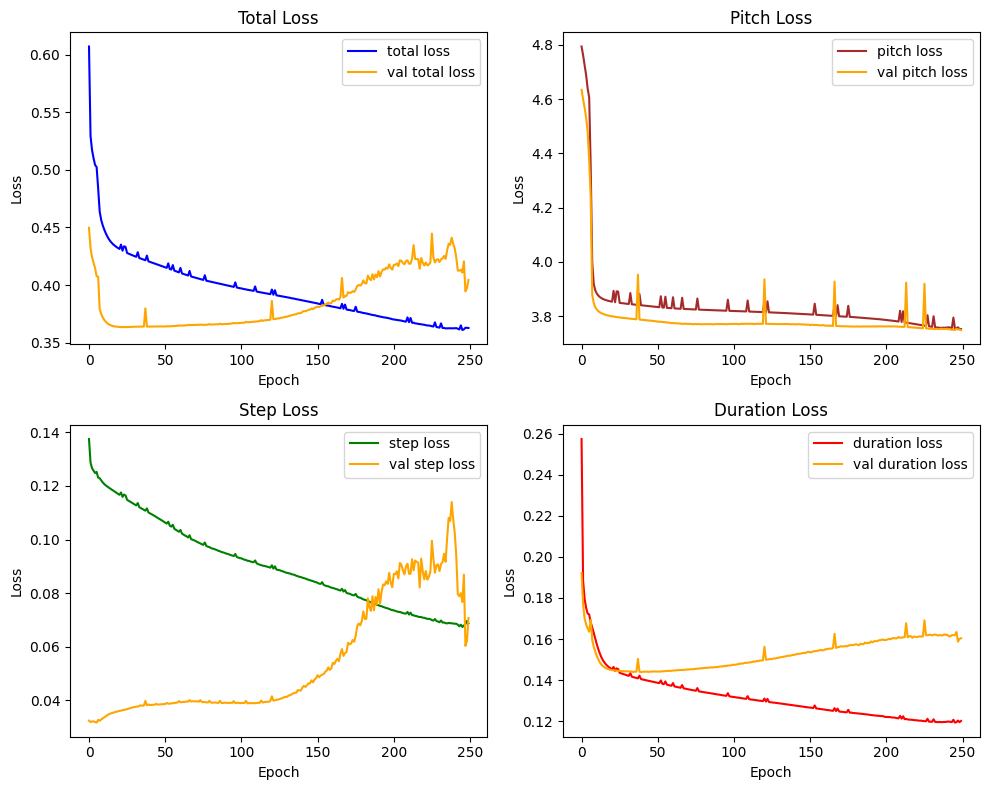

In [50]:
plot_losses_rnn(history_uniforme3)

Se comporta igual que el modelo anterior pero con menos estabilidad en la curva de validación.

In [34]:
model_and_history = {
    'model': model_uniforme3,
    'history': history_uniforme3
}

with open('/content/modelos/model_uniforme3.pkl', 'wb') as f:
    pickle.dump(model_and_history, f)

##### Generación de notas

En el caso de las piezas "uniformes" la sequencia de notas a partir de la cual genera notas es la siguiente:

None


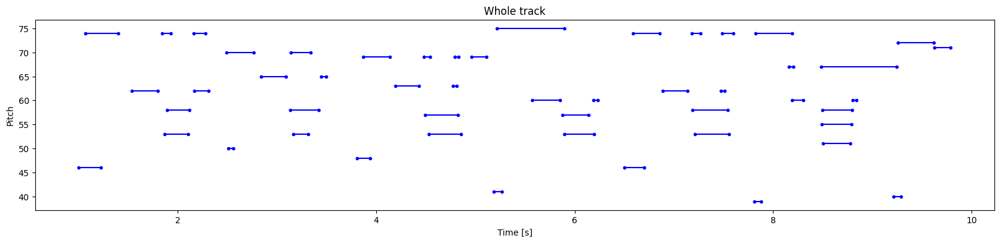

In [ ]:
out_file_uniforme1 = 'sequence_uniforme1.mid'
out_pm_uniforme1 = notes_to_midi(
    train_notes[:50], out_file=out_file_uniforme1, instrument_name=instrument_name)


print(plot_piano_roll(train_notes[:50]))

display_audio(out_pm_uniforme1, seconds=60)

None


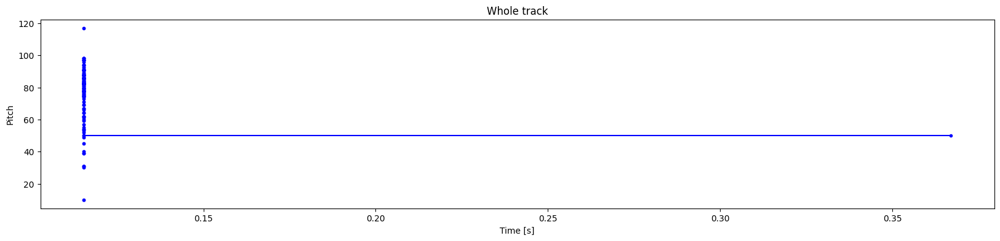

In [ ]:
temperature = 2
num_predictions = 120

uniforme1_df = generate_notes(
    model=model_uniforme1,
    first_seq=train_notes,
    key_order=key_order,
    vocab_size=vocab_size,
    seq_length=seq_length,
    temperature=temperature,
    num_predictions=num_predictions
)

out_file_uniforme1 = 'uniforme1.mid'
out_pm_uniforme1 = notes_to_midi(
    uniforme1_df, out_file=out_file_uniforme1, instrument_name=instrument_name)

print(plot_piano_roll(uniforme1_df))

display_audio(out_pm_uniforme1, seconds=60)

Resulta en el mismo comportamiento que con la música de Mozart.

None


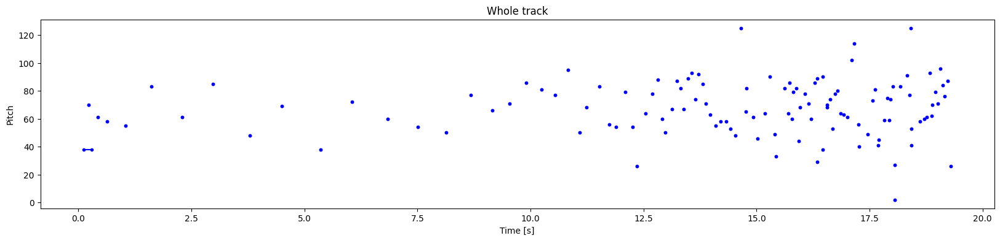

In [ ]:
temperature = 2
num_predictions = 120

uniforme2_df = generate_notes(
    model=model_uniforme2,
    first_seq=train_notes,
    key_order=key_order,
    vocab_size=vocab_size,
    seq_length=seq_length,
    temperature=temperature,
    num_predictions=num_predictions
)

out_file_uniforme2 = 'uniforme2.mid'
out_pm_uniforme2 = notes_to_midi(
    uniforme2_df, out_file=out_file_uniforme2, instrument_name=instrument_name)

print(plot_piano_roll(uniforme2_df))

display_audio(out_pm_uniforme2, seconds=60)

En esta obra maestra destaca el *accelerando* tan característico de la música barroca y romántica, convergiendo en un final apoteósico.

None


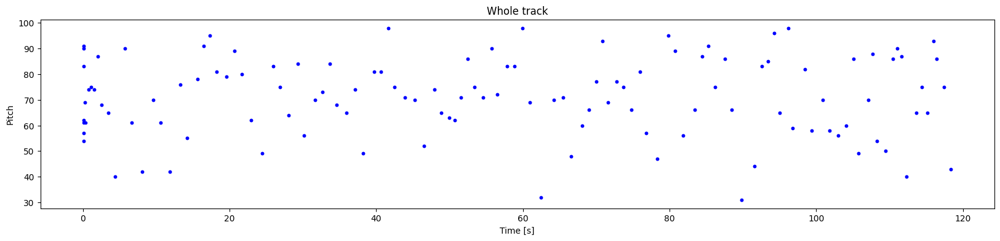

In [52]:
temperature = 2
num_predictions = 120

uniforme3_df = generate_notes(
    model=model_uniforme3,
    first_seq=train_notes,
    key_order=key_order,
    vocab_size=vocab_size,
    seq_length=seq_length,
    temperature=temperature,
    num_predictions=num_predictions
)

out_file_uniforme3 = 'uniforme3.mid'
out_pm_uniforme3 = notes_to_midi(
    uniforme3_df, out_file=out_file_uniforme3, instrument_name=instrument_name)

print(plot_piano_roll(uniforme3_df))

display_audio(out_pm_uniforme3, seconds=60)

En esta secuencia se generan notas con una duración mayor a diferencia del resto de secuencias generadas.

Personalmente, el claro ganador (no tan personal) es el modelo convolucional con 2 LSTMs.

#### GAN

##### Entrenamiento

In [ ]:
# ---------------------------
# Compile MuseGAN
# ---------------------------
latent_dim = 1000
seq_length = 32
num_tracks = 2

generator = build_generator()
discriminator = build_discriminator()
discriminator.compile(loss='binary_crossentropy', optimizer=Adam(0.0005, 0.5), metrics=['accuracy'])

gan_input = Input(shape=(latent_dim,))
generated_music = generator(gan_input)

# Congelamos el discriminador para entrenar solo el generador
discriminator.trainable = False
gan_output = discriminator(generated_music)
gan = Model(gan_input, gan_output)
gan.compile(loss='binary_crossentropy', optimizer=Adam(0.0001, 0.5))

reference_midi = os.path.join(os.getcwd(), 'pieces','MIDIS', piezas[5])


# Entrenamos el modelo
epochs = 1000  # O el número que consideres
batch_size = 32  # O el tamaño de batch que estés usando

if not os.path.exists(reference_midi):
    print(f"Error: The file {reference_midi} does not exist.")
else:
    real_music = midi_to_piano_roll(reference_midi)
    real_music = np.expand_dims(real_music, axis=-1)
    real_music = np.repeat(real_music, num_tracks, axis=-1)
    real_music = np.expand_dims(real_music, axis=0)
    real_music = np.repeat(real_music, batch_size, axis=0)


# Inicializamos listas para almacenar las pérdidas
d_losses = []  # Lista para almacenar la pérdida del discriminador
g_losses = []  # Lista para almacenar la pérdida del generador

for epoch in range(epochs):
    # Entrenamos el discriminador
    noise = np.random.normal(0, 1, (batch_size, latent_dim))
    generated_music = generator.predict(noise)


    # Concatenamos las entradas reales y generadas
    X = np.concatenate([real_music, generated_music])
    y = np.concatenate([np.ones(batch_size), np.zeros(batch_size)])  # 1 para real, 0 para falso

    # Entrenamos el discriminador con los datos concatenados
    d_loss = discriminator.train_on_batch(X, y)

    # Ahora entrenamos el generador
    # Volvemos a permitir el entrenamiento del discriminador en la GAN
    discriminator.trainable = False  # Aseguramos que el discriminador no se entrene aquí

    # Entrenamos la GAN (solo el generador)
    noise = np.random.normal(0, 1, (batch_size, latent_dim))  # Generamos ruido aleatorio
    y_gan = np.ones(batch_size)  # La salida deseada para el generador es que pase como real

    g_loss = gan.train_on_batch(noise, y_gan)

    # Restauramos el entrenamiento del discriminador después de cada iteración de la GAN
    discriminator.trainable = True

    # Almacenamos los valores de las pérdidas
    d_losses.append(d_loss[0])  # Pérdida del discriminador
    g_losses.append(g_loss)  # Pérdida del generador

    # Imprimimos el progreso
    if epoch % 10 == 0:
        print(f"Epoch {epoch} | D Loss: {d_loss[0]} | G Loss: {g_loss}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 604ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py:82: UserWarning: The model does not have any trainable weights.
  warnings.warn("The model does not have any trainable weights.")


Epoch 0 | D Loss: 1.1883405447006226 | G Loss: 0.6997339725494385
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Epoch 10 | D Loss: 1.035213828086853 | G Loss: 0.6563395857810974
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
Epoch 20 | D Loss: 1.0307281017303467 | G Loss: 0.6217676997184753
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1

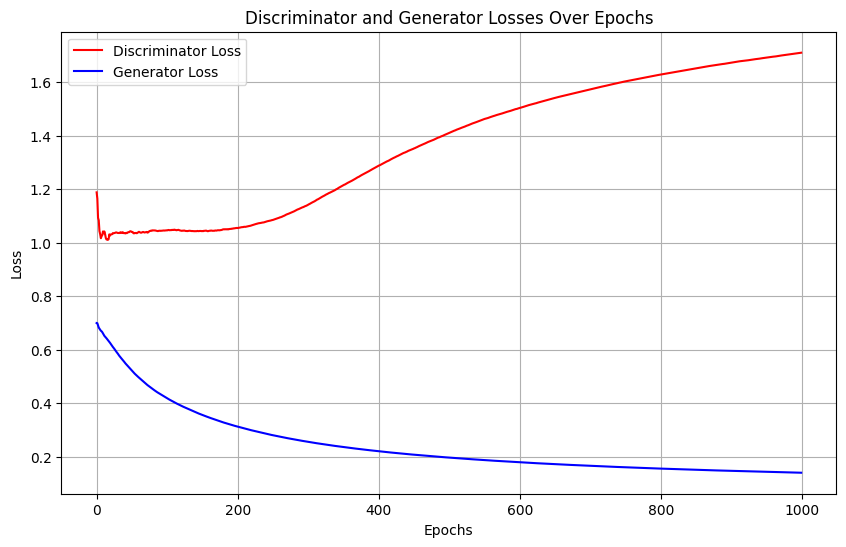

In [ ]:
plot_losses_gan(d_losses, g_losses, epochs)

##### Generación de notas

In [ ]:
midi_file = generate_midi_from_reference(generator, reference_midi)
display_audio(midi_file, seconds=180)  # Display the audio in the notebook

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Se obtienen los mismos resultados que con las piezas de Mozart.

## Conclusiones

El ``step`` es el valor que parece ser el más complicado de predecir. Los modelos pueden tener dificultades para predecir variaciones sutiles en el ritmo, como cambios en el tempo o tiempos de espera entre las notas.

La representación ``step + pitch + duration`` es adecuada en muchos aspectos, pero no captura completamente la polifonía si las notas se representan de manera serializada.

Como se puede observar en la mayoría de las gráficas de las pérdidas (losses), la curva de **pérdidas de validación** se mantiene por debajo de la curva de **pérdidas de entrenamiento**. Esto se debe a que se ha utilizado una tasa de aprendizaje más baja y menos épocas para evitar que el modelo se sobreajuste (overfitting). Con este enfoque, la validación se mantiene estable y por debajo de la curva de entrenamiento, mientras que si se entrenara más, la curva de validación podría superar la de entrenamiento debido al **ajuste excesivo** a los datos de entrenamiento.

A pesar de esta diferencia entre las curvas de entrenamiento y validación, la música generada sigue siendo coherente y estructurada en comparación con los modelos compuestos por una sola LSTM, los cuales producían secuencias desorganizadas con todas las notas sonando simultáneamente (step=0). Esto muestra que, aunque la validación esté por debajo del entrenamiento, el modelo sigue siendo capaz de generar secuencias musicales con sentido.

Creemos que, además de la tasa de aprendizaje, la muestra de validación utilizada no es completamente representativa de la variedad de secuencias musicales que el modelo debe generalizar como nosotros pensamos. Esto puede haber afectado la evaluación y el desempeño del modelo. Una selección de una muestra de validación más representativa podría mejorar la evaluación de la capacidad de generalización del modelo.

En resumen, aunque el modelo genera música coherente, la diferencia entre las curvas de entrenamiento y validación refleja que se ha utilizado un aprendizaje más controlado para evitar el sobreajuste a pesar de que las curvas de entrenamiento no han convergido al mínimo del loss. Además, una mejor selección de la muestra de validación podría proporcionar una evaluación más precisa del modelo.

Problemas en los modelos autoregresivos:

* No captura explícitamente la polifonía: En un modelo autoregresivo, las notas sucesivas se generan una a una, lo que dificulta la generación de acordes simultáneos. Si bien se pueden generar notas que suenen al mismo tiempo, no hay una representación explícita de las relaciones entre las notas simultáneas.

* Repetición y falta de diversidad: Los modelos autoregresivos a menudo tienden a repetir las mismas notas (``pitch``), especialmente cuando los valores de probabilidad para algunas notas son más altos que para otras. Por esta razón, a la hora de generar la secuencia se parametriza con ``temperature`` para que no siempre seleccione la misma nota.


MuseGAN, en contraste, genera múltiples notas simultáneamente en cada paso, lo que le permite aprender patrones de polifonía de manera más natural y efectiva. Además, como el modelo genera acordes y melodías simultáneamente, es más adecuado para representar estructuras musicales más complejas. No obstante, tal vez debido a su compleja implementación (para nosotros) y nuestra falta de conocimiento teórico musical, no hemos conseguido sacarle partido para que lo generado se asimile a la pieza de referencia. Mencionar que el modelo que hemos empleado proviene del repositorio de GitHub: https://github.com/Cchunchunm4ru/music_generator
